In [35]:
import pandas as pd
import numpy as np
from dotenv import load_dotenv
import os
import warnings


# Load environment variables
_ = load_dotenv()

In [36]:
import matplotlib.pyplot as plt
import seaborn as sns
import warnings

# Configuration to suppress warnings
warnings.filterwarnings('ignore')

# Additional configurations for better control over visualizations (optional)
plt.style.use('ggplot')  # For ggplot-like style in plots
pd.options.display.max_columns = None  # Ensure all columns are visible when displaying DataFrames


In [37]:
import matplotlib.dates as mdates
import plotly.express as px



In [38]:
from sklearn.linear_model import Lasso
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score
from statsmodels.tsa.stattools import adfuller
import plotly.graph_objects as go
from ipywidgets import interact, Dropdown
from plotly.subplots import make_subplots
import matplotlib.ticker as ticker
import statsmodels.api as sm



In [39]:
from dash import Dash, html, dcc, Input, Output
import dash
import dash_core_components as dcc
import dash_html_components as html
from dash.dependencies import Input, Output
import ipywidgets as widgets
from ipywidgets import interact, IntSlider, Dropdown, IntRangeSlider
import ipywidgets as widgets

from dash import dcc, html





## Load the Dateset

In [40]:
# Define the path to the dataset
file_path = 'RAW_Data/updated_data_715.csv'

# Load the dataset
df = pd.read_csv(file_path)

In [41]:
df.isnull().sum()

Unnamed: 0       0
time             0
low              0
high             0
open             0
close            0
volume           0
price_change     0
average_price    0
volatility       0
product_id       0
load_dt          0
dtype: int64

In [42]:
def print_dataframe_shape(df):
    rows, columns = df.shape
    print(f"The database has {rows} rows and {columns} columns.")

print_dataframe_shape(df)

The database has 10764 rows and 12 columns.


In [43]:
# Display the first few rows of the dataframe and the counts of unique product IDs
print("First few rows of the dataset:")
print(df.head())
print("\nCount of unique product IDs:")
print(df['product_id'].value_counts())

First few rows of the dataset:
   Unnamed: 0        time        low       high       open      close  \
0           0  2021-07-16  1850.1500  1965.3500  1918.9900  1877.2200   
1           1  2021-07-16   367.1000   410.5000   398.4500   367.8900   
2           2  2021-07-16    26.2040    29.4800    28.5750    26.2960   
3           3  2021-07-16    15.9297    17.5908    17.0647    16.3449   
4           4  2021-07-16     1.1661     1.2452     1.2249     1.1714   

         volume  price_change  average_price  volatility product_id  \
0  1.842217e+05      -41.7700     1907.75000    6.226522    ETH-USD   
1  2.381554e+04      -30.5600      388.80000   11.822392   COMP-USD   
2  3.369130e+05       -2.2790       27.84200   12.501908    SOL-USD   
3  5.165473e+05       -0.7198       16.76025   10.427692    UNI-USD   
4  3.676491e+07       -0.0535        1.20565    6.783295    ADA-USD   

      load_dt  
0  2024-07-15  
1  2024-07-15  
2  2024-07-15  
3  2024-07-15  
4  2024-07-15  

Count 

## Intitial Cleaning, Data Interpolation and Frequency Setting

In [44]:
# Remove the 'Unnamed: 0' column and other columns as it's redundant
df.drop(columns=['Unnamed: 0','load_dt'], inplace=True)

# Convert 'time' column to datetime format
df['time'] = pd.to_datetime(df['time'])

# Sort the DataFrame by the 'time' column
df.sort_values(by='time', ascending=True, inplace=True)

# Set 'time' as the index of the DataFrame
df.set_index('time', inplace=True)

# Calculate daily percentage change in 'close' price
#df['pct_change'] = df['close'].pct_change() # Keeping it in decimal format for more accurate results
# Group the DataFrame by 'product_id' and then apply the percentage change to the 'close' column
df['pct_change'] = df.groupby('product_id')['close'].pct_change()

# Display the first few rows of the updated DataFrame
df.head()


# Print the updated DataFrame to verify changes
print("Updated DataFrame with Daily Frequency and Interpolated Values:")
print(df.head())

# Review unique counts of product IDs if necessary
print("\nCount of unique product IDs:")
print(df['product_id'].value_counts())

Updated DataFrame with Daily Frequency and Interpolated Values:
                  low       high       open      close        volume  \
time                                                                   
2021-07-16  1850.1500  1965.3500  1918.9900  1877.2200  1.842217e+05   
2021-07-16   367.1000   410.5000   398.4500   367.8900  2.381554e+04   
2021-07-16    26.2040    29.4800    28.5750    26.2960  3.369130e+05   
2021-07-16    15.9297    17.5908    17.0647    16.3449  5.165473e+05   
2021-07-16     1.1661     1.2452     1.2249     1.1714  3.676491e+07   

            price_change  average_price  volatility product_id  pct_change  
time                                                                        
2021-07-16      -41.7700     1907.75000    6.226522    ETH-USD         NaN  
2021-07-16      -30.5600      388.80000   11.822392   COMP-USD         NaN  
2021-07-16       -2.2790       27.84200   12.501908    SOL-USD         NaN  
2021-07-16       -0.7198       16.76025   10.4

In [45]:
df.isnull().sum()

low               0
high              0
open              0
close             0
volume            0
price_change      0
average_price     0
volatility        0
product_id        0
pct_change       10
dtype: int64

- Observations:
The data is well-formatted for time-series analysis, with the 'time' column set as the index and financial metrics properly organized.
The pct_change column is correctly calculated, with expected NaN values for the first entry of each cryptocurrency.
The product ID counts are consistent, with 1084 entries for most cryptocurrencies, except for AVAX-USD with 1008 entries, indicating potential missing data or a later start date.


In [46]:
### Fix the pct change!!
### It should be used per each coin separately, otherwise it'll mix up the price of different coins!

In [47]:
df.head()

,low,high,open,close,volume,price_change,average_price,volatility,product_id,pct_change
time,,,,,,,,,,
2021-07-16,1850.1500,1965.3500,1918.9900,1877.2200,1.842217e+05,-41.7700,1907.75000,6.226522,ETH-USD,NaN
2021-07-16,367.1000,410.5000,398.4500,367.8900,2.381554e+04,-30.5600,388.80000,11.822392,COMP-USD,NaN
2021-07-16,26.2040,29.4800,28.5750,26.2960,3.369130e+05,-2.2790,27.84200,12.501908,SOL-USD,NaN
2021-07-16,15.9297,17.5908,17.0647,16.3449,5.165473e+05,-0.7198,16.76025,10.427692,UNI-USD,NaN
2021-07-16,1.1661,1.2452,1.2249,1.1714,3.676491e+07,-0.0535,1.20565,6.783295,ADA-USD,NaN


### Summary Statistics

In [48]:
# Identify numeric columns for statistical analysis
numeric_cols = df.select_dtypes(include=[np.number])  # This selects all the columns that are of numeric type

# Group by 'product_id' and calculate basic statistics for numeric columns
grouped_stats = df.groupby('product_id')[numeric_cols.columns].agg(['mean', 'std', 'min', 'max'])

# Calculate skewness and kurtosis separately using apply() for compatibility
skewness = df.groupby('product_id')[numeric_cols.columns].apply(lambda x: x.skew()).rename(columns=lambda x: x + '_skew')
kurtosis = df.groupby('product_id')[numeric_cols.columns].apply(lambda x: x.kurt()).rename(columns=lambda x: x + '_kurtosis')

# Concatenate the skewness and kurtosis DataFrames to the grouped_stats DataFrame
detailed_stats = pd.concat([grouped_stats, skewness, kurtosis], axis=1)

print("\nDetailed Summary Statistics by Cryptocurrency:")
print(detailed_stats)



Detailed Summary Statistics by Cryptocurrency:
             (low, mean)    (low, std)  (low, min)  (low, max)  (high, mean)  \
product_id                                                                     
ADA-USD         0.693826      0.568090      0.2300      2.9045      0.746372   
AVAX-USD       34.061974     26.731678      8.6200    126.2500     37.334038   
BTC-USD     36476.653718  15079.334679  15460.0000  71337.3000  38135.471125   
COMP-USD      102.054493    106.422680     23.1500    475.2200    111.350507   
ETH-USD      2306.483164    883.238030    879.8000   4697.9000   2436.128007   
LINK-USD       12.508462      6.847953      4.9260     33.4000     13.527634   
LTC-USD        92.019649     39.399077     40.3200    259.2000     98.274880   
MATIC-USD       0.984159      0.413650      0.3162      2.7131      1.067077   
SOL-USD        72.710804     58.815262      8.0000    245.8000     79.517627   
UNI-USD         9.205171      6.137585      3.3240     29.5190      9.98

- Volatility Insights: The detailed breakdown of volatility across cryptocurrencies assists in identifying which assets might require more stringent risk controls, especially in diversifying investment approaches.
- Price Behavior: The range in price statistics (minimum, maximum, mean, standard deviation) across different cryptocurrencies highlights the diverse investment thresholds and potential entry or exit points for traders.
- Market Response: High skewness and kurtosis values in certain cryptocurrencies suggest that some assets have responses to market news or events that are not normally distributed, potentially indicating a propensity for sudden large price moves or 'fat tails' in distribution.

### EDA

### Initial EDA

In [49]:
print(df.head())


                  low       high       open      close        volume  \
time                                                                   
2021-07-16  1850.1500  1965.3500  1918.9900  1877.2200  1.842217e+05   
2021-07-16   367.1000   410.5000   398.4500   367.8900  2.381554e+04   
2021-07-16    26.2040    29.4800    28.5750    26.2960  3.369130e+05   
2021-07-16    15.9297    17.5908    17.0647    16.3449  5.165473e+05   
2021-07-16     1.1661     1.2452     1.2249     1.1714  3.676491e+07   

            price_change  average_price  volatility product_id  pct_change  
time                                                                        
2021-07-16      -41.7700     1907.75000    6.226522    ETH-USD         NaN  
2021-07-16      -30.5600      388.80000   11.822392   COMP-USD         NaN  
2021-07-16       -2.2790       27.84200   12.501908    SOL-USD         NaN  
2021-07-16       -0.7198       16.76025   10.427692    UNI-USD         NaN  
2021-07-16       -0.0535        1

#### Interactive Time Series Plot

In [50]:
# Generate the interactive line plot
fig = px.line(df, x=df.index, y='pct_change', color='product_id', 
              title='Interactive Time Series of Percentage Changes',
              labels={'pct_change': 'Percentage Change (%)', 'product_id': 'Cryptocurrency'})

# Enhance the plot with a range slider for better navigation
fig.update_xaxes(rangeslider_visible=True)

# Update traces to be hidden by default
for trace in fig.data:
    trace.visible = 'legendonly'

fig.show()

### Distribution Analysis - Histograms

In [51]:
# Create a histogram of percentage changes to analyze the distribution
fig = px.histogram(df, x='pct_change', color='product_id',
                   marginal='box',  # adds a boxplot alongside the histogram
                   barmode='overlay',
                   nbins=100,  # adjust the number of bins for better resolution
                   title='Distribution of Percentage Changes by Cryptocurrency')

# Set all traces to be hidden by default, appear on legend click
for trace in fig.data:
    trace.visible = 'legendonly'

fig.update_layout(
    barmode='overlay',  # Overlays bars on top of each other
    bargap=0.1          # Sets gap between bars of adjacent location coordinates.
)

fig.show()

### Interactive Scatter Plot of Percentage Change vs. Volume

In [52]:
# Generate the scatter plot of percentage change vs volume
fig = px.scatter(df, x='volume', y='pct_change', color='product_id',
                 title='Volume vs. Percentage Change by Cryptocurrency',
                 labels={'volume': 'Trading Volume', 'pct_change': 'Percentage Change (%)'})

# Set all traces to be hidden by default, appear on legend click
for trace in fig.data:
    trace.visible = 'legendonly'

fig.show()

### Day of the Week Analysis

In [53]:
# Extract day of the week and map it to day names
df['day_of_week'] = df.index.dayofweek
day_map = {0: 'Monday', 1: 'Tuesday', 2: 'Wednesday', 3: 'Thursday', 4: 'Friday', 5: 'Saturday', 6: 'Sunday'}
df['day_name'] = df['day_of_week'].map(day_map)

# Calculate average percentage change by day of the week for each product
avg_pct_change_by_day = df.groupby(['product_id', 'day_of_week', 'day_name'])['pct_change'].mean().reset_index()

# Ensure the data is sorted by day of the week to avoid plotting issues
avg_pct_change_by_day.sort_values(by=['product_id', 'day_of_week'], inplace=True)

# Generate the interactive line plot
fig = px.line(avg_pct_change_by_day, x='day_name', y='pct_change', color='product_id',
              title='Average Percentage Change by Day of the Week',
              labels={'day_name': 'Day of the Week', 'pct_change': 'Average Percentage Change (%)'},
              category_orders={'day_name': ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']})

# Set all traces to be hidden by default, appear on legend click
for trace in fig.data:
    trace.visible = 'legendonly'

fig.show()


### Testing Whether the Data is Statioary
Stationarity in time series data means that the statistical properties of the series like mean, variance, and autocorrelation do not change over time. For financial time series data like cryptocurrency percentage changes, ensuring stationarity is essential for making reliable forecasts.

In [54]:
### Add Title and enhance the visualization with specific cryptocurrency title
def test_stationarity(timeseries, crypto, window=12):
    # Calculate rolling statistics
    rolling_mean = timeseries.rolling(window=window).mean()
    rolling_std = timeseries.rolling(window=window).std()

    # Prepare Plotly graph using a more detailed layout
    fig = make_subplots(specs=[[{"secondary_y": True}]])
    fig.add_trace(go.Scatter(x=timeseries.index, y=timeseries, name='Original', line=dict(color='#4FBAF7')), secondary_y=False)
    fig.add_trace(go.Scatter(x=timeseries.index, y=rolling_mean, name='Rolling Mean', line=dict(color='red')), secondary_y=False)
    fig.add_trace(go.Scatter(x=timeseries.index, y=rolling_std, name='Rolling Std Dev', line=dict(color='black')), secondary_y=True)

    # Perform Dickey-Fuller test
    result = adfuller(timeseries.dropna(), autolag='AIC', maxlag=20)
    test_stat = result[0]
    p_value = result[1]
    critical_values = result[4]

    # Add Dickey-Fuller test results to the plot
    title_text = f'{crypto} - Dickey-Fuller Test: Test Statistic = {test_stat:.2f}, p-value = {p_value:.4f}'
    fig.update_layout(title=title_text,
                      xaxis_title='Time',
                      yaxis_title='Value',
                      legend_title='Legend',
                      font=dict(size=14),
                      showlegend=True,
                      margin=dict(l=20, r=20, t=50, b=20))

    for key, value in critical_values.items():
        fig.add_hline(y=value, line_dash="dot", annotation_text=f'Critical Value {key}', 
                      annotation_position="bottom right")

    # Enhance visibility and zoom
    fig.update_yaxes(range=[min(timeseries.dropna()) * 0.95, max(timeseries.dropna()) * 1.05], secondary_y=False)
    fig.update_yaxes(range=[min(rolling_std.dropna()) * 0.95, max(rolling_std.dropna()) * 1.05], secondary_y=True)
    
    fig.show()

# Dropdown to select cryptocurrency
dropdown = Dropdown(options=df['product_id'].unique())

# Function to update plot based on selected cryptocurrency
def update_plot(crypto):
    crypto_data = df[df['product_id'] == crypto]['pct_change']  # Changed to 'pct_change' as requested
    test_stationarity(crypto_data, crypto)

# Show dropdown and update plot based on selection
interact(update_plot, crypto=dropdown)


interactive(children=(Dropdown(description='crypto', options=('ETH-USD', 'COMP-USD', 'SOL-USD', 'UNI-USD', 'AD…

<function __main__.update_plot(crypto)>

#### Time Series Visualization with Trend Lines

In [55]:
# Create a subplot layout
fig = make_subplots(rows=len(df['product_id'].unique()), cols=1, shared_xaxes=True)

# Iterate over each unique cryptocurrency for plotting
for i, (label, df_product) in enumerate(df.groupby('product_id')):
    df_product = df_product.dropna(subset=['pct_change'])  # Drop NaN values for clean plotting
    if len(df_product) > 1:
        # Add line trace for percentage changes
        fig.add_trace(go.Scatter(x=df_product.index, y=df_product['pct_change'],
                                 mode='lines', name=f'{label} % Change'), row=i+1, col=1)
        
        # Add trend line using numpy's polyfit
        valid_dates = df_product.index
        coefficients = np.polyfit(range(len(df_product)), df_product['pct_change'], 1)
        trendline = np.polyval(coefficients, range(len(df_product)))
        fig.add_trace(go.Scatter(x=valid_dates, y=trendline,
                                 mode='lines', name=f'{label} Trend', line=dict(dash='dash')), row=i+1, col=1)

# Update layout to make it cleaner
fig.update_layout(height=900, width=1100, title_text="Percentage Change with Trend Lines by Cryptocurrency")
fig.update_xaxes(title_text="Time")
fig.update_yaxes(title_text="Percentage Change (%)", ticksuffix="%")

# Set all traces to be hidden by default, appear on legend click
for trace in fig.data:
    trace.visible = 'legendonly'

fig.show()


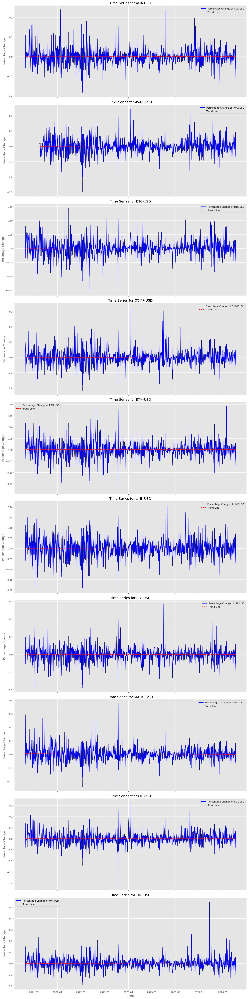

In [56]:
# Set the figure size and subplots
fig, axs = plt.subplots(len(df['product_id'].unique()), figsize=(15, 6 * len(df['product_id'].unique())), sharex=True)

# Ensure 'axs' is always an array, even with one product_id
axs = np.array(axs).reshape(-1)

# Iterate over each unique cryptocurrency for plotting
for i, (label, df_product) in enumerate(df.groupby('product_id')):
    # Ensure data for plotting is continuous and free of NaN values at the start
    df_product_nonan = df_product.dropna(subset=['pct_change'])
    
    axs[i].plot(df_product.index, df_product['pct_change'], label=f'Percentage Change of {label}', color='blue')
    
    # Only add a trend line if there are enough data points after dropping NaNs
    if len(df_product_nonan) > 1:  # ensure at least two data points are available
        valid_dates = mdates.date2num(df_product_nonan.index)  # convert dates to numerical format
        z = np.polyfit(valid_dates, df_product_nonan['pct_change'], 1)
        p = np.poly1d(z)
        axs[i].plot(df_product_nonan.index, p(valid_dates), "r--", label="Trend Line")
    
    axs[i].set_title(f'Time Series for {label}')
    axs[i].set_ylabel('Percentage Change')
    axs[i].legend()

plt.xlabel('Time')
plt.tight_layout()
plt.show()


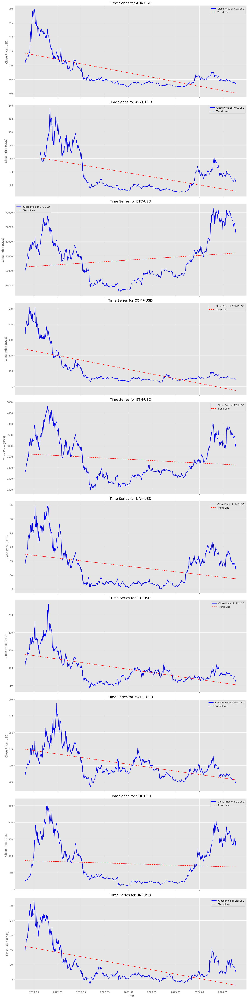

In [57]:
### Add date
# Set the figure size and subplots
fig, axs = plt.subplots(len(df['product_id'].unique()), figsize=(15, 6 * len(df['product_id'].unique())), sharex=True)

# Iterate over each unique cryptocurrency for plotting
for i, (label, df_product) in enumerate(df.groupby('product_id')):
    axs[i].plot(df_product.index, df_product['close'], label=f'Close Price of {label}', color='blue')
    # Adding a trend line
    z = np.polyfit(mdates.date2num(df_product.index), df_product['close'], 1)
    p = np.poly1d(z)
    axs[i].plot(df_product.index, p(mdates.date2num(df_product.index)), "r--", label="Trend Line")
    axs[i].set_title(f'Time Series for {label}')
    axs[i].set_ylabel('Close Price (USD)')
    axs[i].legend()

plt.xlabel('Time')
plt.tight_layout()
plt.show()

This segment creates a subplot for each cryptocurrency with its close prices over time, enhanced with trend lines to easily visualize the overall direction of price movements.

## Data Cleaning & Feature Engineering

In [58]:
# Print the column names of the DataFrame
print(df.columns)


Index(['low', 'high', 'open', 'close', 'volume', 'price_change',
       'average_price', 'volatility', 'product_id', 'pct_change',
       'day_of_week', 'day_name'],
      dtype='object')


In [59]:
# Check if the DataFrame is sorted by time
is_sorted = df.index.is_monotonic_increasing
print(f"The DataFrame is sorted by time: {is_sorted}")


The DataFrame is sorted by time: True


In [60]:
# Print the DataFrame's index to check if 'time' is the index
print(df.index)


DatetimeIndex(['2021-07-16', '2021-07-16', '2021-07-16', '2021-07-16',
               '2021-07-16', '2021-07-16', '2021-07-16', '2021-07-16',
               '2021-07-16', '2021-07-17',
               ...
               '2024-07-08', '2024-07-08', '2024-07-08', '2024-07-08',
               '2024-07-08', '2024-07-08', '2024-07-08', '2024-07-08',
               '2024-07-08', '2024-07-08'],
              dtype='datetime64[ns]', name='time', length=10764, freq=None)


In [61]:
print(df.index.dtype)
print("Data timeline:")
print("Start date:", df.index.min())
print("End date:", df.index.max())
print("Number of days:", (df.index.max() - df.index.min()).days)

datetime64[ns]
Data timeline:
Start date: 2021-07-16 00:00:00
End date: 2024-07-08 00:00:00
Number of days: 1088


In [62]:
df.head()

,low,high,open,close,volume,price_change,average_price,volatility,product_id,pct_change,day_of_week,day_name
time,,,,,,,,,,,,
2021-07-16,1850.1500,1965.3500,1918.9900,1877.2200,1.842217e+05,-41.7700,1907.75000,6.226522,ETH-USD,NaN,4,Friday
2021-07-16,367.1000,410.5000,398.4500,367.8900,2.381554e+04,-30.5600,388.80000,11.822392,COMP-USD,NaN,4,Friday
2021-07-16,26.2040,29.4800,28.5750,26.2960,3.369130e+05,-2.2790,27.84200,12.501908,SOL-USD,NaN,4,Friday
2021-07-16,15.9297,17.5908,17.0647,16.3449,5.165473e+05,-0.7198,16.76025,10.427692,UNI-USD,NaN,4,Friday
2021-07-16,1.1661,1.2452,1.2249,1.1714,3.676491e+07,-0.0535,1.20565,6.783295,ADA-USD,NaN,4,Friday


In [63]:
# # Adding lag features for close prices and volume
# for lag in [1, 3, 7]:  # Example lags: previous day, 3 days ago, and a week ago
#     df[f'close_lag_{lag}'] = df['close'].shift(lag)
#     df[f'volume_lag_{lag}'] = df['volume'].shift(lag)

# # Calculate Moving Average (MA)
# df['close_MA10'] = df['close'].rolling(window=10).mean()

# # Calculate Exponential Moving Average (EMA) for different periods
# for window in [7, 14, 30]:
#     df[f'close_ema_{window}'] = df['close'].ewm(span=window, adjust=False).mean()

# # Calculate Relative Strength Index (RSI)
# delta = df['close'].diff()
# gain = (delta.where(delta > 0, 0)).rolling(window=14).mean()
# loss = (-delta.where(delta < 0, 0)).rolling(window=14).mean()
# rs = gain / loss
# df['RSI'] = 100 - (100 / (1 + rs))

# # Calculate Moving Average Convergence Divergence (MACD)
# exp1 = df['close'].ewm(span=12, adjust=False).mean()
# exp2 = df['close'].ewm(span=26, adjust=False).mean()
# df['MACD'] = exp1 - exp2
# df['Signal_Line'] = df['MACD'].ewm(span=9, adjust=False).mean()

# # Calculate Rolling Volatility
# for window in [7, 14, 30]:
#     df[f'volatility_{window}d'] = df['pct_change'].rolling(window=window).std() * np.sqrt(window)

# # Calculate Market Momentum
# for window in [1, 7, 30]:  # momentum over 1 day, 1 week, and 1 month
#     df[f'momentum_{window}d'] = df['close'] / df['close'].shift(window) - 1

# # Seasonal Indicators
# df['day_of_week'] = df.index.dayofweek
# df['month_of_year'] = df.index.month

# df_null_values = df.isnull().sum()
# # Clean up any resulting missing values before modeling
# df.dropna(inplace=True)

# # Define the split point for training and testing datasets in a time series manner
# split_date = '2023-12-31'  # or '2024-01-01'
# train = df[df.index < split_date]
# test = df[df.index >= split_date]

# # Ensure the test set comprises approximately 20% of the data
# test_size = 0.2
# train_size = 1 - test_size
# train = train.tail(int(len(df) * train_size))

# # # Increase display settings for columns
# # pd.set_option('display.max_columns', None)
# # pd.set_option('display.width', 1000)

# # # Print detailed information about the DataFrames
# # print("Training and Test set sizes:", train.shape, test.shape)
# # print("\nTraining data range: {} to {}".format(train.index.min(), train.index.max()))
# # print("Testing data range: {} to {}".format(test.index.min(), test.index.max()))

# # # Print full information on a few rows to understand the dataset structure better
# # print("\nDetailed sample of Training Set:")
# # print(train.head())

# # print("\nDetailed sample of Testing Set:")
# # print(test.head())
# print('------------------------Original Missinig Values--------------------------')
# print(df_null_values)

In [64]:

# def add_technical_indicators(group):
#     group['pct_change'] = group['close'].pct_change()

#     # Adding lag features for close prices and volume
#     for lag in [1, 3, 7]:  # Example lags: previous day, 3 days ago, and a week ago
#         group[f'close_lag_{lag}'] = group['close'].shift(lag)
#         group[f'volume_lag_{lag}'] = group['volume'].shift(lag)

#     # Calculate Moving Average (MA)
#     group['close_MA10'] = group['close'].rolling(window=10).mean()

#     # Calculate Exponential Moving Average (EMA) for different periods
#     for window in [7, 14, 30]:
#         group[f'close_ema_{window}'] = group['close'].ewm(span=window, adjust=False).mean()

#     # Calculate Relative Strength Index (RSI)
#     delta = group['close'].diff()
#     gain = (delta.where(delta > 0, 0)).rolling(window=14).mean()
#     loss = (-delta.where(delta < 0, 0)).rolling(window=14).mean()
#     rs = gain / loss
#     group['RSI'] = 100 - (100 / (1 + rs))

#     # Calculate Moving Average Convergence Divergence (MACD)
#     exp1 = group['close'].ewm(span=12, adjust=False).mean()
#     exp2 = group['close'].ewm(span=26, adjust=False).mean()
#     group['MACD'] = exp1 - exp2
#     group['Signal_Line'] = group['MACD'].ewm(span=9, adjust=False).mean()

#     # Calculate Rolling Volatility
#     for window in [7, 14, 30]:
#         group[f'volatility_{window}d'] = group['pct_change'].rolling(window=window).std() * np.sqrt(window)

#     # Calculate Market Momentum
#     for window in [1, 7, 30]:  # momentum over 1 day, 1 week, and 1 month
#         group[f'momentum_{window}d'] = group['close'] / group['close'].shift(window) - 1

#     return group

# # Apply the function to each group
# df.reset_index(inplace=True)
# # df.head()
# df_new = df.groupby('product_id').apply(add_technical_indicators)
# df_new.head()
# # Reset the index to keep 'time' and 'product_id' as columns
# df_new.reset_index(inplace=True)
# df_new.head()

# # Apply the transformations to each group
#df_new = df.groupby('product_id').apply(apply_transformations)

# # Clean up any resulting missing values before modeling
#df.dropna(inplace=True)

# df_new = df.reset_index(['product_id','time'])
# # Reset the index if 'product_id' is part of it


# # Define the split point for training and testing datasets in a time series manner
# split_date = '2023-12-31'  # or '2024-01-01'
# train = df[df.index < split_date]
# test = df[df.index >= split_date]

# # Ensure the test set comprises approximately 20% of the data
# test_size = 0.2
# train_size = 1 - test_size
# train = train.tail(int(len(df) * train_size))

# # Increase display settings for columns
# pd.set_option('display.max_columns', None)
# pd.set_option('display.width', 1000)

# # Print detailed information about the DataFrames
# print("Training and Test set sizes:", train.shape, test.shape)
# print("\nTraining data range: {} to {}".format(train.index.min(), train.index.max()))
# print("Testing data range: {} to {}".format(test.index.min(), test.index.max()))

# # Print full information on a few rows to understand the dataset structure better
# print("\nDetailed sample of Training Set:")
# print(train.head())

# print("\nDetailed sample of Testing Set:")
# print(test.head())


In [65]:
# Function to add technical indicators for each product_id
def add_technical_indicators(group):
    group['pct_change'] = group['close'].pct_change()

    # Adding lag features for close prices and volume
    for lag in [1, 3, 7]:  # Example lags: previous day, 3 days ago, and a week ago
        group[f'close_lag_{lag}'] = group['close'].shift(lag)
        group[f'volume_lag_{lag}'] = group['volume'].shift(lag)

    # Calculate Moving Average (MA)
    group['close_MA10'] = group['close'].rolling(window=10).mean()

    # Calculate Exponential Moving Average (EMA) for different periods
    for window in [7, 14, 30]:
        group[f'close_ema_{window}'] = group['close'].ewm(span=window, adjust=False).mean()

    # Calculate Relative Strength Index (RSI)
    delta = group['close'].diff()
    gain = (delta.where(delta > 0, 0)).rolling(window=14).mean()
    loss = (-delta.where(delta < 0, 0)).rolling(window=14).mean()
    rs = gain / loss
    group['RSI'] = 100 - (100 / (1 + rs))

    # Calculate Moving Average Convergence Divergence (MACD)
    exp1 = group['close'].ewm(span=12, adjust=False).mean()
    exp2 = group['close'].ewm(span=26, adjust=False).mean()
    group['MACD'] = exp1 - exp2
    group['Signal_Line'] = group['MACD'].ewm(span=9, adjust=False).mean()

    # Calculate Rolling Volatility
    for window in [7, 14, 30]:
        group[f'volatility_{window}d'] = group['pct_change'].rolling(window=window).std() * np.sqrt(window)

    # Calculate Market Momentum
    for window in [1, 7, 30]:  # momentum over 1 day, 1 week, and 1 month
        group[f'momentum_{window}d'] = group['close'] / group['close'].shift(window) - 1

    return group

# Apply the function to each group
# df_new = df.reset_index(drop=True)
df_new = df.groupby('product_id').apply(add_technical_indicators)

# Reset the index correctly and store it in df_new_reset
# Drop the existing 'product_id' column if it exists
if 'product_id' in df_new.columns:
    df_new = df_new.drop(columns=['product_id'])

# Drop the existing 'time' column if it exists
if 'time' in df_new.columns:
    df_new = df_new.drop(columns=['time'])
df_new_reset = df_new.reset_index(level=['product_id', 'time'])

# Ensure 'time' and 'product_id' columns exist and are in the correct format
# df_new_reset['time'] = pd.to_datetime(df_new_reset['time'])
# df_new_reset['product_id'] = df_new_reset['product_id'].astype(str)
# # df_new_reset.drop(columns=['index'], inplace = True)
df_new_reset.head()


,product_id,time,low,high,open,close,volume,price_change,average_price,volatility,pct_change,day_of_week,day_name,close_lag_1,volume_lag_1,close_lag_3,volume_lag_3,close_lag_7,volume_lag_7,close_MA10,close_ema_7,close_ema_14,close_ema_30,RSI,MACD,Signal_Line,volatility_7d,volatility_14d,volatility_30d,momentum_1d,momentum_7d,momentum_30d
0,ADA-USD,2021-07-16,1.1661,1.2452,1.2249,1.1714,36764908.57,-0.0535,1.20565,6.783295,NaN,4,Friday,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.171400,1.171400,1.171400,NaN,0.000000,0.000000,NaN,NaN,NaN,NaN,NaN,NaN
1,ADA-USD,2021-07-17,1.1503,1.1954,1.1714,1.1730,30485996.64,0.0016,1.17285,3.920716,0.001366,5,Saturday,1.1714,36764908.57,NaN,NaN,NaN,NaN,NaN,1.171800,1.171613,1.171503,NaN,0.000128,0.000026,NaN,NaN,NaN,0.001366,NaN,NaN
2,ADA-USD,2021-07-18,1.1674,1.2193,1.1731,1.1815,20204036.80,0.0084,1.19335,4.445777,0.007246,6,Sunday,1.1730,30485996.64,NaN,NaN,NaN,NaN,NaN,1.174225,1.172932,1.172148,NaN,0.000904,0.000201,NaN,NaN,NaN,0.007246,NaN,NaN
3,ADA-USD,2021-07-19,1.1159,1.1922,1.1816,1.1226,38666530.06,-0.0590,1.15405,6.837530,-0.049852,0,Monday,1.1815,20204036.80,1.1714,36764908.57,NaN,NaN,NaN,1.161319,1.166221,1.168952,NaN,-0.003196,-0.000478,NaN,NaN,NaN,-0.049852,NaN,NaN
4,ADA-USD,2021-07-20,1.0250,1.1365,1.1228,1.0559,98783713.28,-0.0669,1.08075,10.878049,-0.059416,1,Tuesday,1.1226,38666530.06,1.1730,30485996.64,NaN,NaN,NaN,1.134964,1.151511,1.161658,NaN,-0.011693,-0.002721,NaN,NaN,NaN,-0.059416,NaN,NaN


In [66]:
df_new_reset.isnull().sum()

product_id          0
time                0
low                 0
high                0
open                0
close               0
volume              0
price_change        0
average_price       0
volatility          0
pct_change         10
day_of_week         0
day_name            0
close_lag_1        10
volume_lag_1       10
close_lag_3        30
volume_lag_3       30
close_lag_7        70
volume_lag_7       70
close_MA10         90
close_ema_7         0
close_ema_14        0
close_ema_30        0
RSI               130
MACD                0
Signal_Line         0
volatility_7d      70
volatility_14d    140
volatility_30d    300
momentum_1d        10
momentum_7d        70
momentum_30d      300
dtype: int64

#### Data Preprocessing

In [72]:
# set the index once again for the dataframe and sort by the time column
df_new_reset = df_new_reset.sort_values(by='time')
df_new_reset = df_new_reset.set_index('time')



# Check data type of index
print("Data type of index:", df_new_reset.index.dtype)

# Display range of dates in the data
print("Start date:", df_new_reset.index.min())
print("End date:", df_new_reset.index.max())


Data type of index: datetime64[ns]
Start date: 2021-07-16 00:00:00
End date: 2024-07-08 00:00:00


In [75]:
df_new_reset.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 10764 entries, 2021-07-16 to 2024-07-08
Data columns (total 31 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   product_id      10764 non-null  object 
 1   low             10764 non-null  float64
 2   high            10764 non-null  float64
 3   open            10764 non-null  float64
 4   close           10764 non-null  float64
 5   volume          10764 non-null  float64
 6   price_change    10764 non-null  float64
 7   average_price   10764 non-null  float64
 8   volatility      10764 non-null  float64
 9   pct_change      10754 non-null  float64
 10  day_of_week     10764 non-null  int32  
 11  day_name        10764 non-null  object 
 12  close_lag_1     10754 non-null  float64
 13  volume_lag_1    10754 non-null  float64
 14  close_lag_3     10734 non-null  float64
 15  volume_lag_3    10734 non-null  float64
 16  close_lag_7     10694 non-null  float64
 17  volume_lag_7  

In [73]:
# check_max = train.reset_index()
# check_max['time'].max()

In [ ]:
# check_min = test.reset_index()
# check_min['time'].min()

The output confirms that the data has been successfully partitioned into training and testing sets, maintaining a clear chronological order, which is essential for time series analysis. Specifically, the training set encompasses data from August 5, 2021, to December 30, 2023, while the testing set begins immediately thereafter, spanning from December 31, 2023, to July 8, 2024. This split ensures that the temporal sequence is preserved, avoiding potential data leakage and making the setup suitable for subsequent time series forecasting models. The training set comprises 8,684 observations, and the testing set includes 1,900 observations, maintaining a suitable split that is ideal for robust model training and validation phases. This structured approach reflects a sound methodological practice in time series analysis, ensuring a reliable foundation for model development and evaluation.

In [80]:
# Check DataFrame to confirm changes
print(df_new_reset.describe())
print(f"\nDataFrame info:\n")
print(df_new_reset.info())


               low          high          open         close        volume  \
count  10764.00000  10764.000000  10764.000000  10764.000000  1.076400e+04   
mean    3938.10909   4120.970553   4032.123641   4034.363583  1.051009e+07   
std    11916.17101  12468.480686  12202.045248  12209.403911  2.823616e+07   
min        0.23000      0.246100      0.241900      0.242100  1.821578e+03   
25%        6.00950      6.382500      6.193250      6.192500  1.095763e+05   
50%       31.30000     33.724060     32.532755     32.536160  6.184873e+05   
75%      142.07500    153.465000    148.152500    148.082500  2.893342e+06   
max    71337.30000  73835.570000  73135.040000  73135.040000  4.214616e+08   

       price_change  average_price    volatility    pct_change   day_of_week  \
count  10764.000000   10764.000000  10764.000000  10754.000000  10764.000000   
mean       2.239942    4029.539822      7.364042      0.000809      3.000000   
std      391.041960   12191.084597      5.388240      0.0

## EDA

In [ ]:
# df_new_reset = df_new.reset_index()

# # Ensure 'time' and 'product_id' columns exist and are in the correct format
# df_new_reset['time'] = pd.to_datetime(df_new_reset['time'])
# df_new_reset['product_id'] = df_new_reset['product_id'].astype(str)

### Visualize Rolling Volatility

In [82]:
# Interactive plot for rolling volatility

fig = px.line(df_new_reset.reset_index(), x='time', y='volatility_30d', color='product_id',
              labels={'volatility_30d': '30-Day Volatility'},
              title='30-Day Rolling Volatility for Each Cryptocurrency')

# Update to make individual lines selectable
fig.update_traces(visible="legendonly")  # Make all lines invisible by default; they appear when clicked in legend.

fig.update_xaxes(rangeslider_visible=True)
fig.show()

In [ ]:

# # Interactive plot for rolling volatility
# fig = px.line(df.reset_index(), x='time', y='volatility_30d', color='product_id',
#               labels={'volatility_30d': '30-Day Volatility'},
#               title='30-Day Rolling Volatility for Each Cryptocurrency')

# # Update to make individual lines selectable
# fig.update_traces(visible="legendonly")  # Make all lines invisible by default; they appear when clicked in legend.

# fig.update_xaxes(rangeslider_visible=True)
# fig.show()

### Interactive Market Momentum

In [83]:
# Interactive plot for market momentum
fig_momentum = px.line(df_new_reset.reset_index(), x='time', y='momentum_30d', color='product_id',
                       labels={'momentum_30d': '30-Day Momentum'},
                       title='30-Day Market Momentum for Each Cryptocurrency')

# Update to make individual lines selectable
fig_momentum.update_traces(visible="legendonly")  # Make all lines invisible by default; they appear when clicked in legend.

fig_momentum.update_xaxes(rangeslider_visible=True)
fig_momentum.show()

In [ ]:
# # Interactive plot for market momentum
# fig_momentum = px.line(df.reset_index(), x='time', y='momentum_30d', color='product_id',
#                        labels={'momentum_30d': '30-Day Momentum'},
#                        title='30-Day Market Momentum for Each Cryptocurrency')

# # Update to make individual lines selectable
# fig_momentum.update_traces(visible="legendonly")  # Make all lines invisible by default; they appear when clicked in legend.

# fig_momentum.update_xaxes(rangeslider_visible=True)
# fig_momentum.show()

### Interactive Box Plot for Seasonal Patterns

In [84]:
# Mapping numerical days to day names
days = {0: 'Monday', 1: 'Tuesday', 2: 'Wednesday', 3: 'Thursday', 4: 'Friday', 5: 'Saturday', 6: 'Sunday'}
df_new_reset['day_name'] = df_new_reset['day_of_week'].map(days)

# Interactive box plot for day of the week effects, focusing on percentage change
fig_season = px.box(df_new_reset.reset_index(), x='day_name', y='pct_change', color='product_id',
                    labels={'day_name': 'Day of the Week', 'pct_change': 'Percentage Change'},
                    title='Percentage Change Distribution by Day of Week for Each Cryptocurrency')

# Update the traces to be toggleable via the legend, this is a workaround since 'legendonly' isn't directly available
for trace in fig_season.data:
    trace.visible = "legendonly"  # Hide all traces; they appear when their legend entry is clicked.

fig_season.show()

In [ ]:
# # Mapping numerical days to day names
# days = {0: 'Monday', 1: 'Tuesday', 2: 'Wednesday', 3: 'Thursday', 4: 'Friday', 5: 'Saturday', 6: 'Sunday'}
# df['day_name'] = df['day_of_week'].map(days)

# # Interactive box plot for day of the week effects, focusing on percentage change
# fig_season = px.box(df.reset_index(), x='day_name', y='pct_change', color='product_id',
#                     labels={'day_name': 'Day of the Week', 'pct_change': 'Percentage Change'},
#                     title='Percentage Change Distribution by Day of Week for Each Cryptocurrency')

# # Update the traces to be toggleable via the legend, this is a workaround since 'legendonly' isn't directly available
# for trace in fig_season.data:
#     trace.visible = "legendonly"  # Hide all traces; they appear when their legend entry is clicked.

fig_season.show()

### Interactive Exponential Moving Averages and Percentage Change

In [85]:
# Interactive plot for EMA and Percentage Changes
fig_ema = px.line(df_new_reset.reset_index(), x='time', y=['pct_change', 'close_ema_30'], color='product_id',
                  labels={'value': 'Percentage', 'variable': 'Type'},
                  title='Percentage Changes and 30-Day Exponential Moving Averages')

# Update the traces to make individual lines selectable via the legend
fig_ema.update_traces(visible="legendonly")  # Make all lines invisible by default; they appear when clicked in legend.

fig_ema.update_xaxes(rangeslider_visible=True)
fig_ema.show()

In [ ]:
# # Interactive plot for EMA and Percentage Changes
# fig_ema = px.line(df.reset_index(), x='time', y=['pct_change', 'close_ema_30'], color='product_id',
#                   labels={'value': 'Percentage', 'variable': 'Type'},
#                   title='Percentage Changes and 30-Day Exponential Moving Averages')

# # Update the traces to make individual lines selectable via the legend
# fig_ema.update_traces(visible="legendonly")  # Make all lines invisible by default; they appear when clicked in legend.

# fig_ema.update_xaxes(rangeslider_visible=True)
# fig_ema.show()

In [86]:
# Data preparation
df_long = df_new_reset.reset_index().melt(id_vars=['time', 'product_id'], value_vars=['pct_change', 'close_ema_30'],
                                var_name='Type', value_name='Value')

# Interactive plot for EMA and Percentage Changes
fig_ema = px.line(df_long, x='time', y='Value', color='product_id', line_dash='Type',
                  labels={'Value': 'Percentage', 'Type': 'Metric'},
                  title='Percentage Changes and 30-Day Exponential Moving Averages',
                  color_discrete_map={'pct_change': 'blue', 'close_ema_30': 'red'})

# Update the traces to make individual lines selectable via the legend
fig_ema.for_each_trace(lambda t: t.update(visible="legendonly"))

# Customization for a clearer legend and range slider
fig_ema.update_traces(mode='lines')
fig_ema.update_xaxes(rangeslider_visible=True)
fig_ema.update_layout(legend_title_text='Cryptocurrency and Metric')

fig_ema.show()

### Analysis of Percentage Changes and 30-Day EMAs Across Cryptocurrencies

In [87]:
# Data preparation for plotting
df_eda = df_new_reset.reset_index().melt(id_vars=['time', 'product_id'], value_vars=['pct_change', 'close_ema_30'],
                                var_name='Metric', value_name='Value')

# Interactive plot for Percentage Changes and 30-Day Exponential Moving Averages
fig_ema = px.line(df_eda, x='time', y='Value', color='product_id', line_dash='Metric',
                  labels={'Value': 'Percentage', 'Metric': 'Metric Type'},
                  title='Analysis of Percentage Changes and 30-Day EMAs Across Cryptocurrencies',
                  color_discrete_map={'pct_change': 'blue', 'close_ema_30': 'red'})

# Update the traces to make individual lines selectable via the legend
fig_ema.for_each_trace(lambda t: t.update(visible="legendonly"))

# Customize plot to enhance clarity
fig_ema.update_traces(mode='lines')
fig_ema.update_xaxes(rangeslider_visible=True)
fig_ema.update_layout(legend_title_text='Cryptocurrency and Metric')

fig_ema.show()

### Distribution of 'Percentage Change' of Prices for Each Cryptocurrency

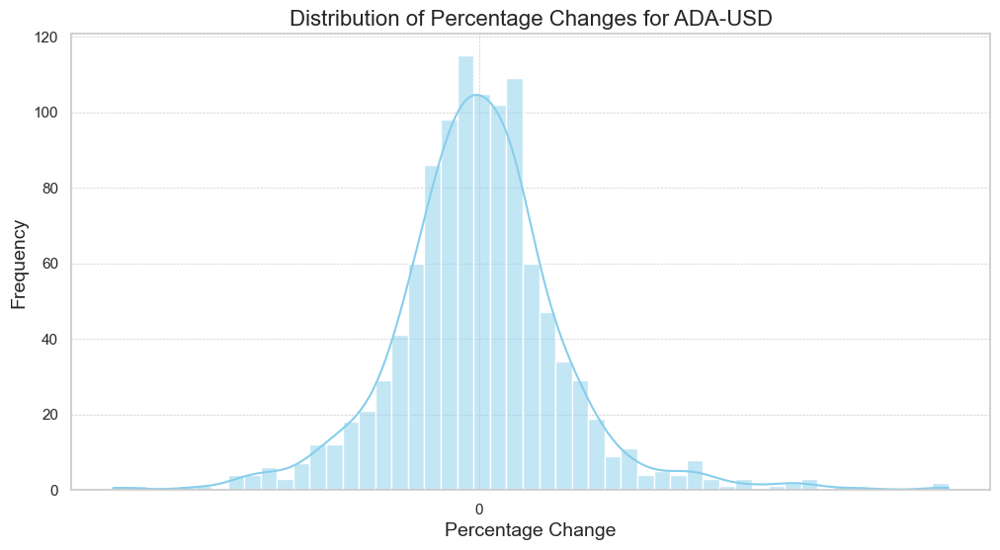

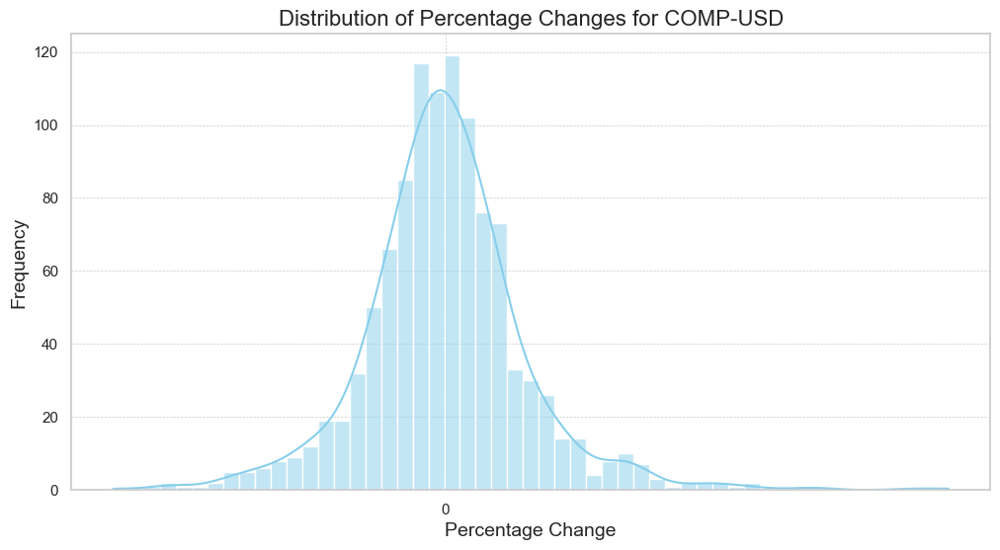

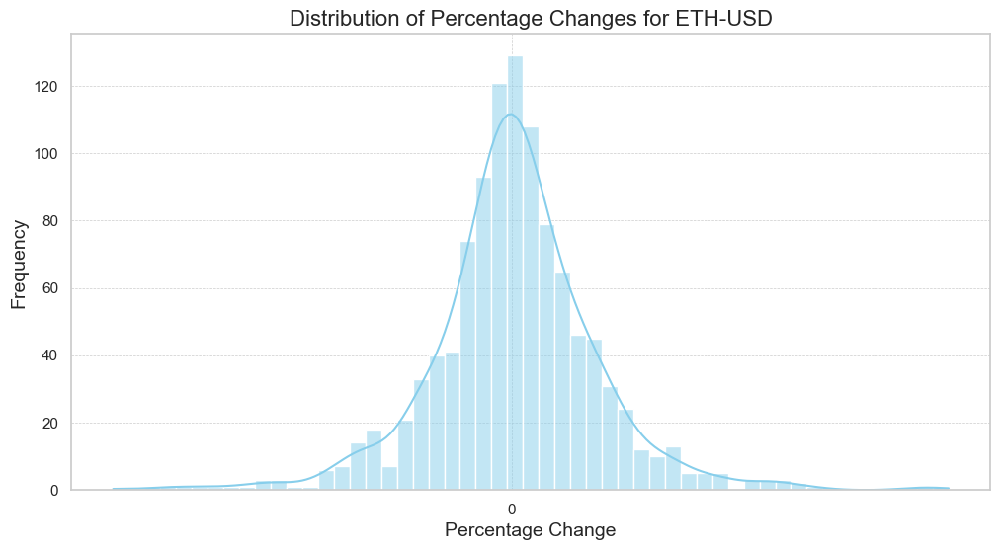

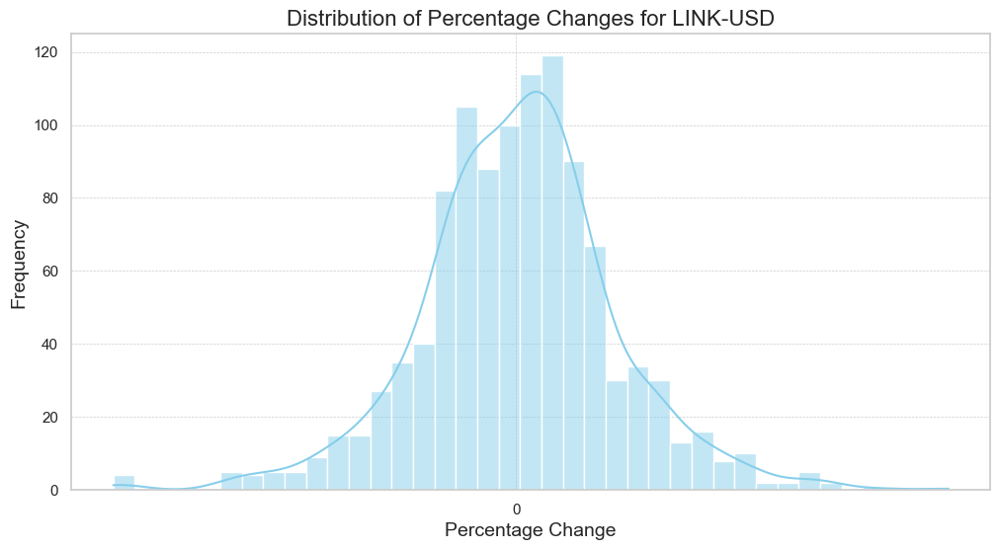

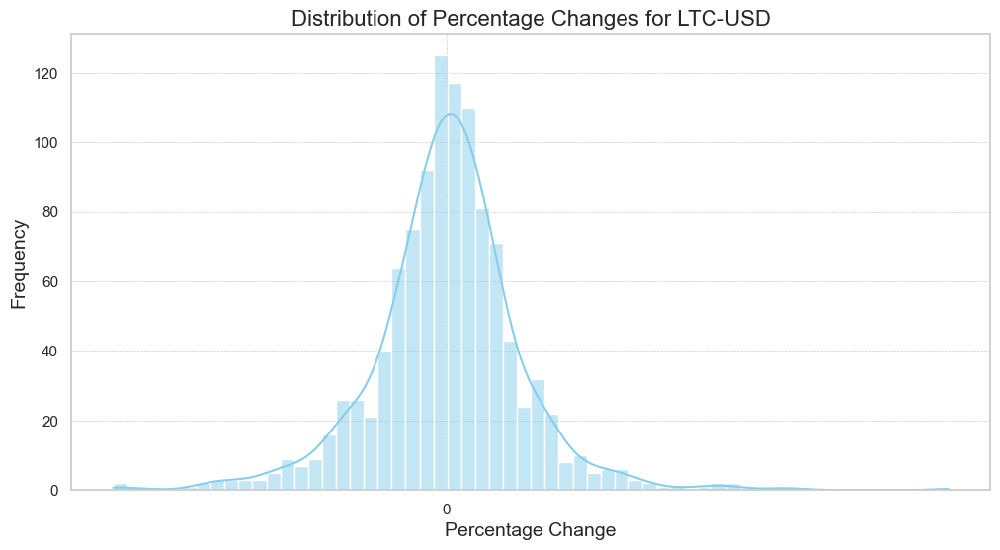

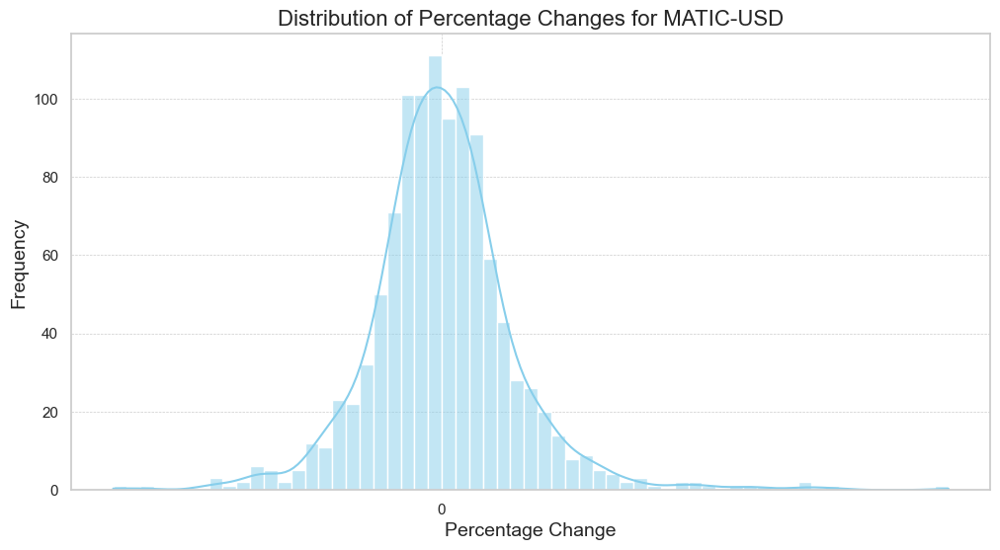

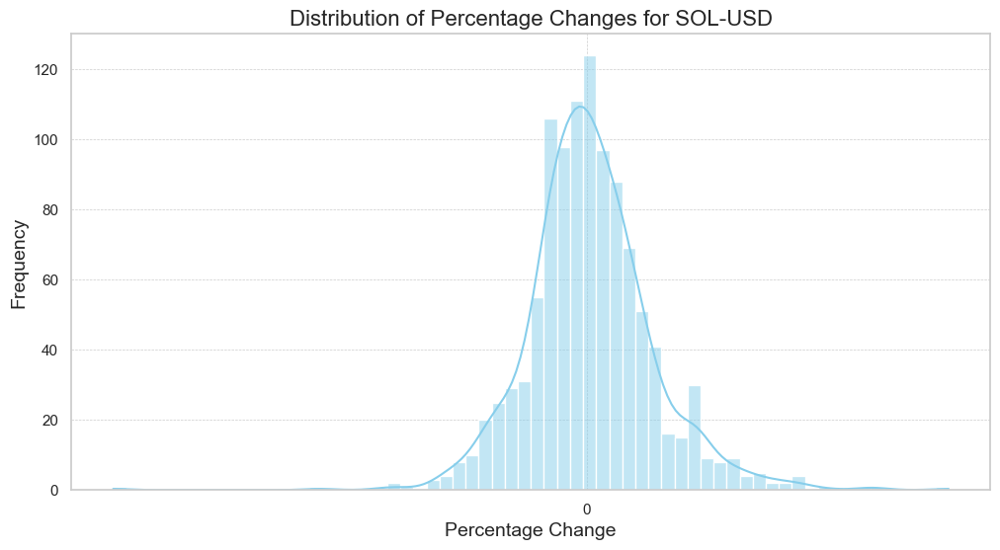

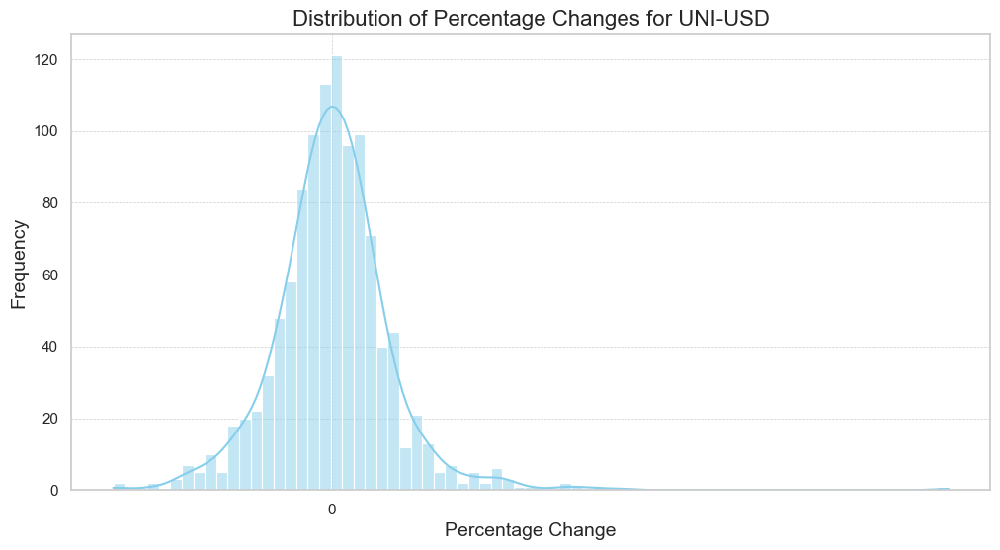

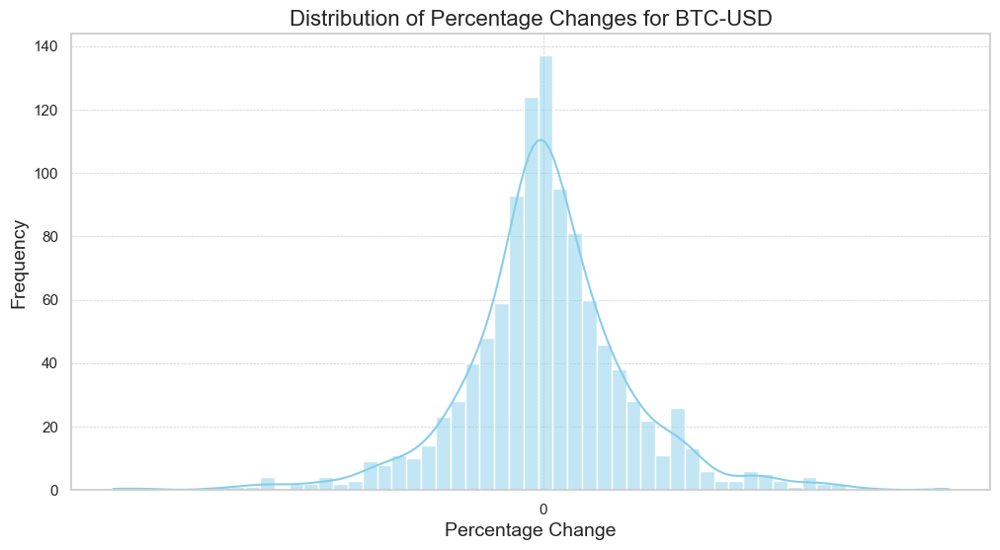

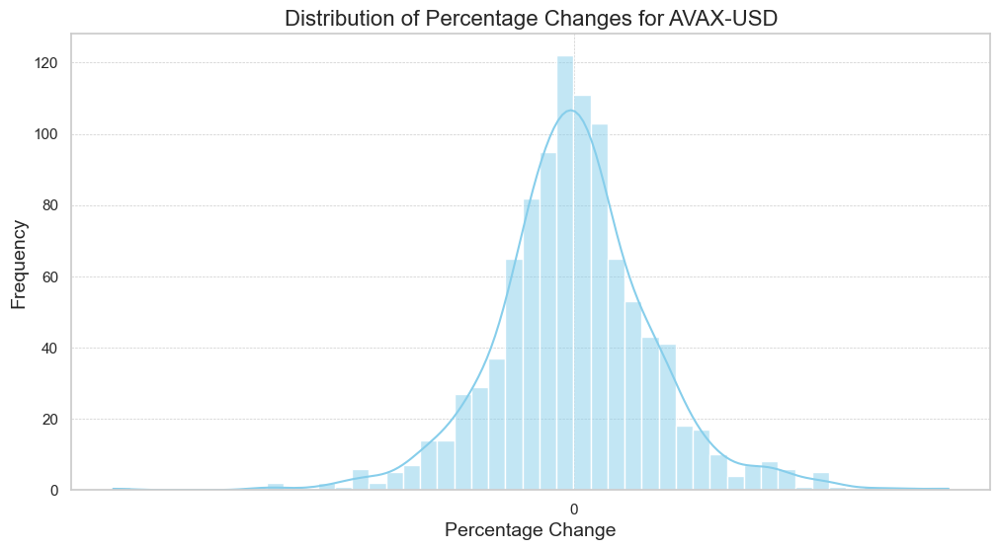

In [88]:
# Setting the style
sns.set(style="whitegrid")

# Distribution of percentage changes per cryptocurrency
for coin in df_new_reset['product_id'].unique():
    plt.figure(figsize=(12, 6))
    ax = sns.histplot(df_new_reset[df_new_reset['product_id'] == coin]['pct_change'], kde=True, color='skyblue')
    
    # Formatting the plot
    ax.set_title(f'Distribution of Percentage Changes for {coin}', fontsize=16)
    ax.set_xlabel('Percentage Change', fontsize=14)
    ax.set_ylabel('Frequency', fontsize=14)
    
    # Handling extreme values by setting custom ticks based on data range
    pct_range = df_new_reset[df_new_reset['product_id'] == coin]['pct_change'].max() - df_new_reset[df_new_reset['product_id'] == coin]['pct_change'].min()
    if pct_range > 1000:
        major_tick = int(pct_range / 10)  # reduce number of major ticks for wide ranges
    else:
        major_tick = 50  # default tick setting for closer ranges
    
    ax.xaxis.set_major_locator(ticker.MultipleLocator(major_tick))
    ax.xaxis.set_minor_locator(ticker.MultipleLocator(major_tick / 5))  # smaller increments
    ax.xaxis.set_major_formatter(ticker.ScalarFormatter())

    # Add grid for better readability
    ax.grid(True, which='both', linestyle='--', linewidth=0.5)
    
    plt.show()

In [ ]:
# # Setting the style
# sns.set(style="whitegrid")

# # Distribution of percentage changes per cryptocurrency
# for coin in df['product_id'].unique():
#     plt.figure(figsize=(12, 6))
#     ax = sns.histplot(df[df['product_id'] == coin]['pct_change'], kde=True, color='skyblue')
    
#     # Formatting the plot
#     ax.set_title(f'Distribution of Percentage Changes for {coin}', fontsize=16)
#     ax.set_xlabel('Percentage Change', fontsize=14)
#     ax.set_ylabel('Frequency', fontsize=14)
    
#     # Handling extreme values by setting custom ticks based on data range
#     pct_range = df[df['product_id'] == coin]['pct_change'].max() - df[df['product_id'] == coin]['pct_change'].min()
#     if pct_range > 1000:
#         major_tick = int(pct_range / 10)  # reduce number of major ticks for wide ranges
#     else:
#         major_tick = 50  # default tick setting for closer ranges
    
#     ax.xaxis.set_major_locator(ticker.MultipleLocator(major_tick))
#     ax.xaxis.set_minor_locator(ticker.MultipleLocator(major_tick / 5))  # smaller increments
#     ax.xaxis.set_major_formatter(ticker.ScalarFormatter())

#     # Add grid for better readability
#     ax.grid(True, which='both', linestyle='--', linewidth=0.5)
    
#     plt.show()


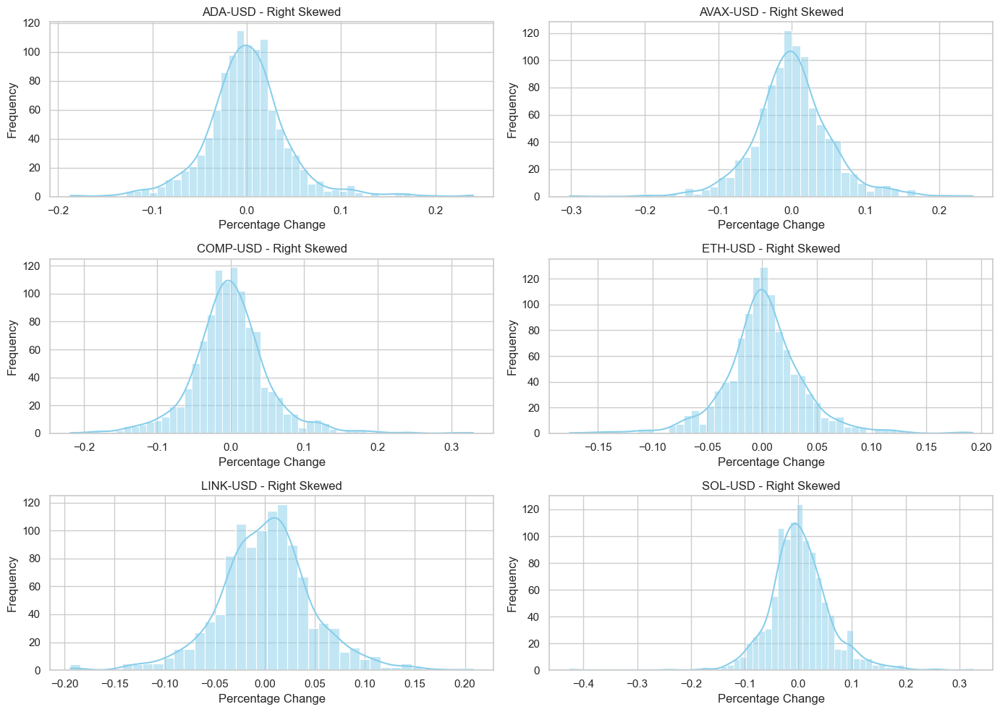

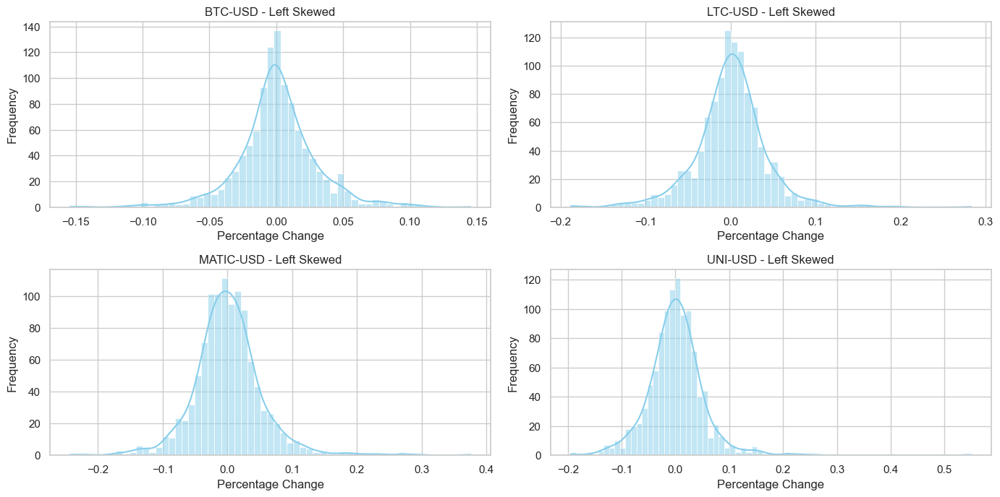

In [89]:
# Define lists for right-skewed and left-skewed distributions
right_skewed = ['ADA-USD', 'AVAX-USD', 'COMP-USD', 'ETH-USD', 'LINK-USD', 'SOL-USD']
left_skewed = ['BTC-USD', 'LTC-USD', 'MATIC-USD', 'UNI-USD']

# Function to plot distributions
def plot_distributions(df, coins, skewness):
    plt.figure(figsize=(14, 10))
    for i, coin in enumerate(coins, 1):
        plt.subplot(3, 2, i)
        sns.histplot(df[df['product_id'] == coin]['pct_change'], kde=True, color='skyblue')
        plt.title(f'{coin} - {skewness} Skewed')
        plt.xlabel('Percentage Change')
        plt.ylabel('Frequency')
    plt.tight_layout()
    plt.show()

# Plot right-skewed distributions
plot_distributions(df_new_reset, right_skewed, 'Right')

# Plot left-skewed distributions
plot_distributions(df_new_reset, left_skewed, 'Left')

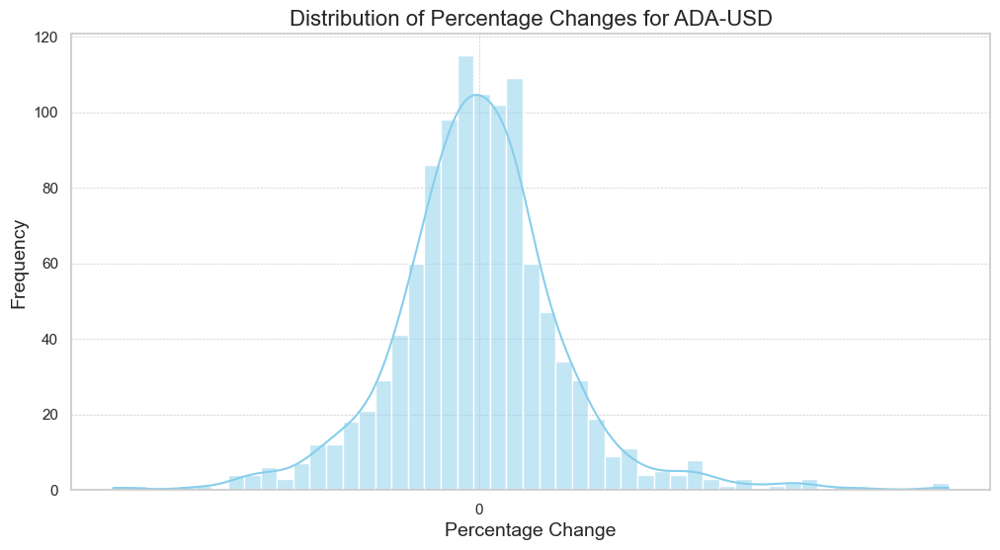

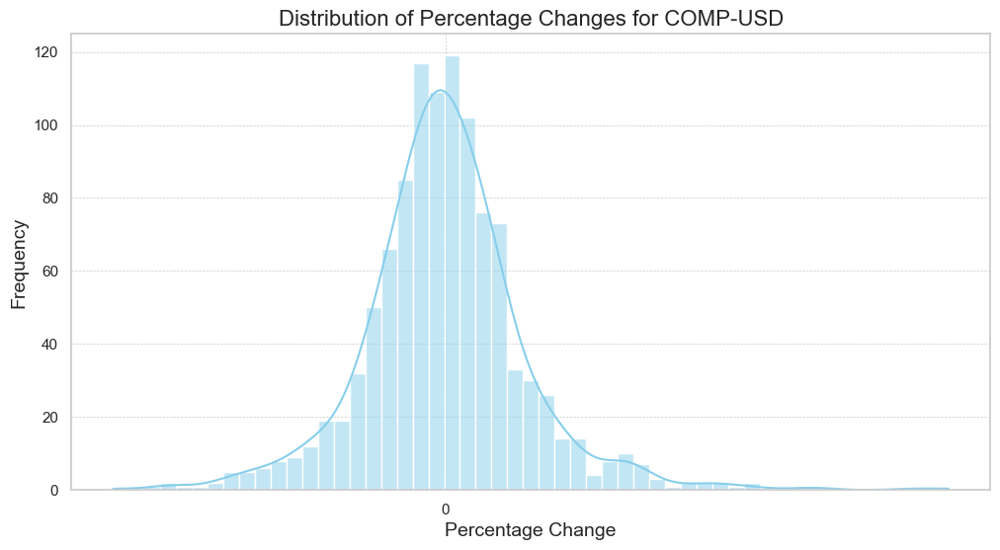

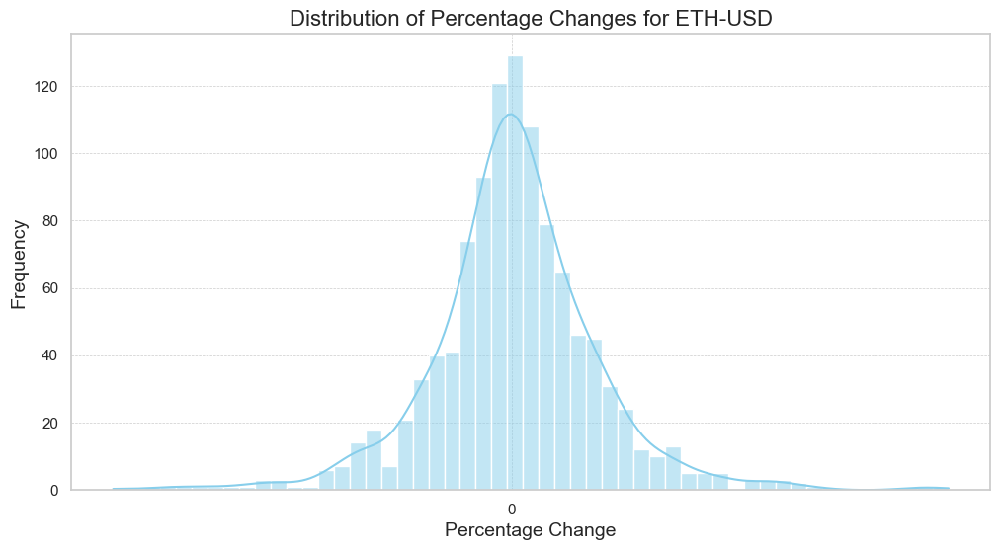

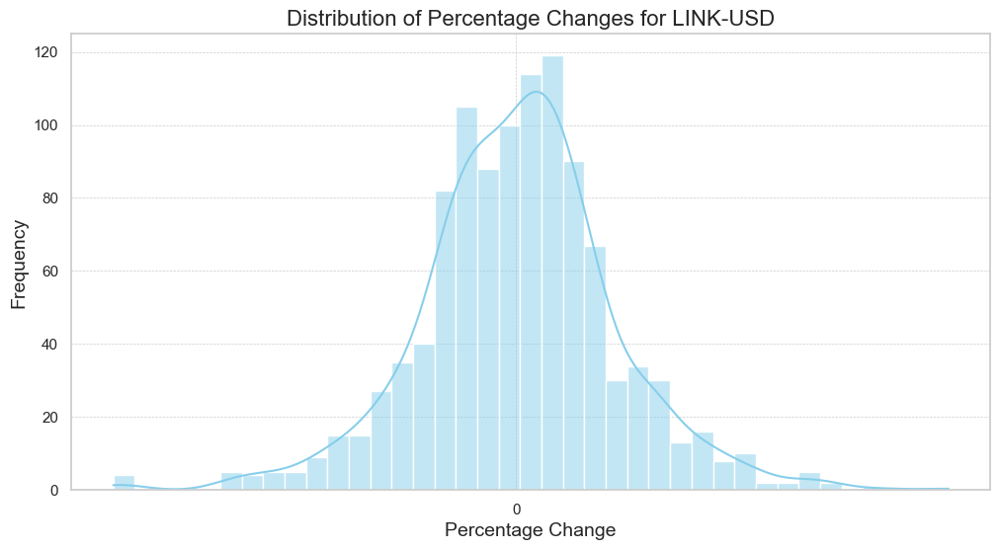

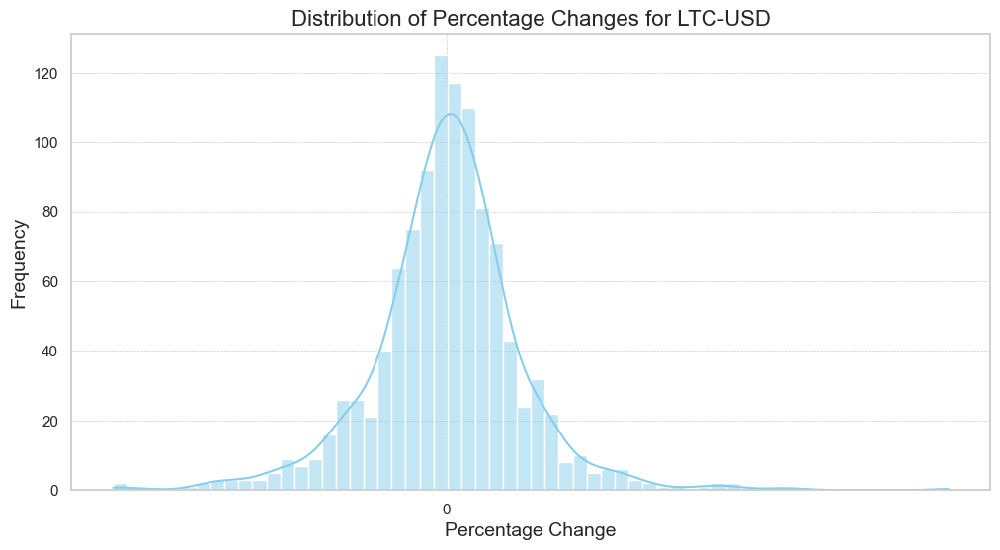

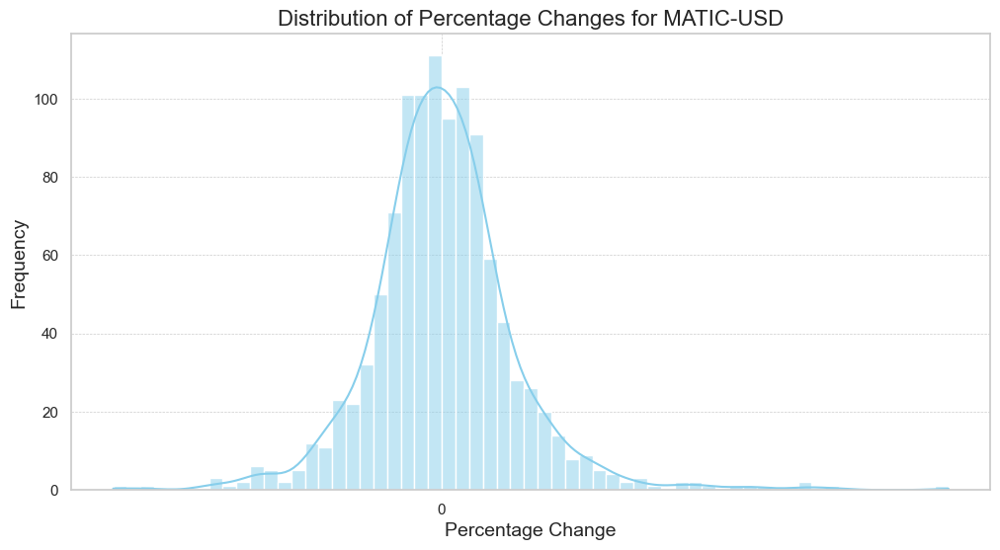

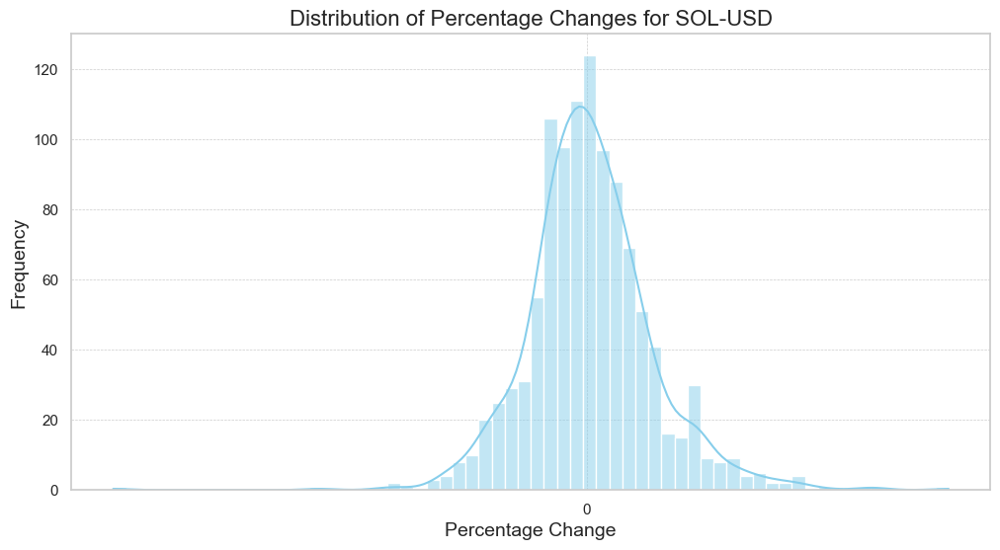

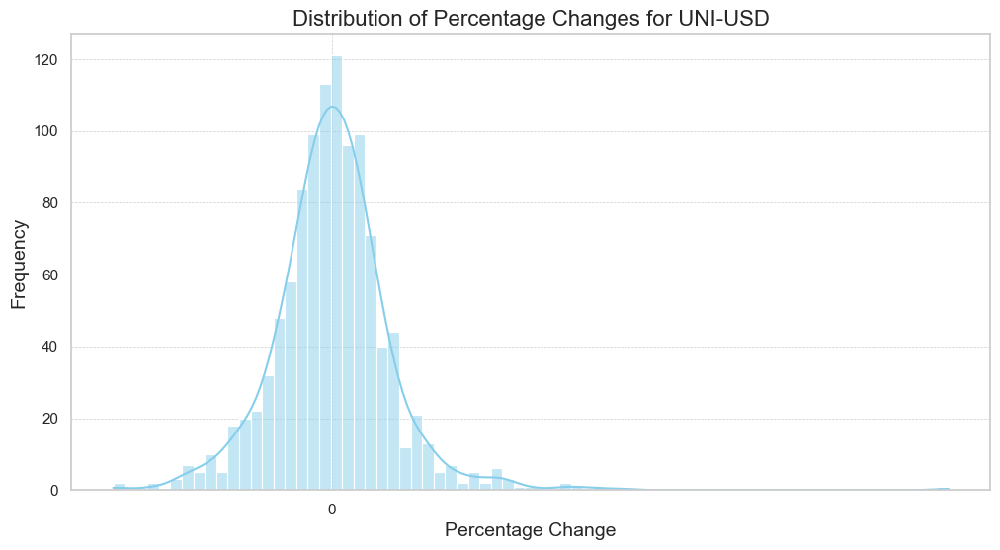

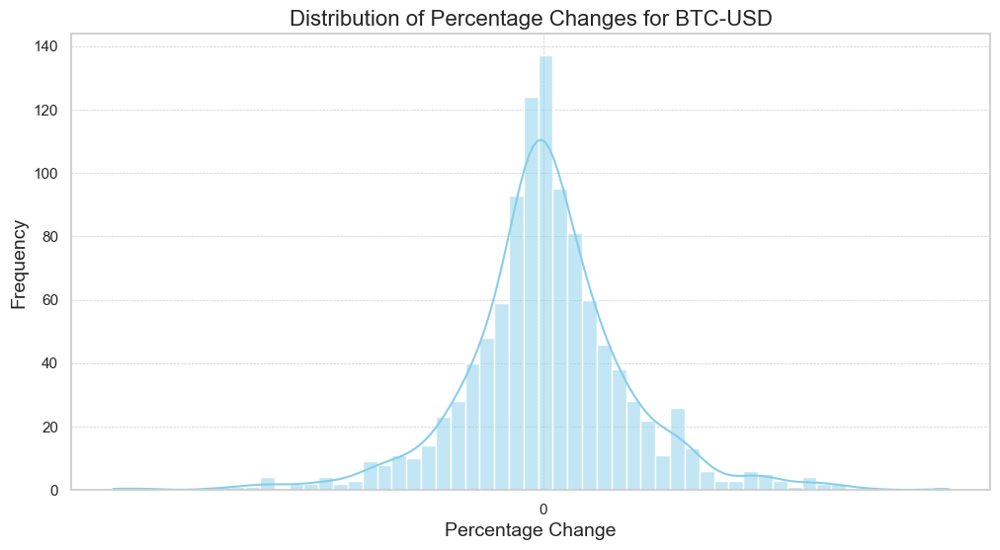

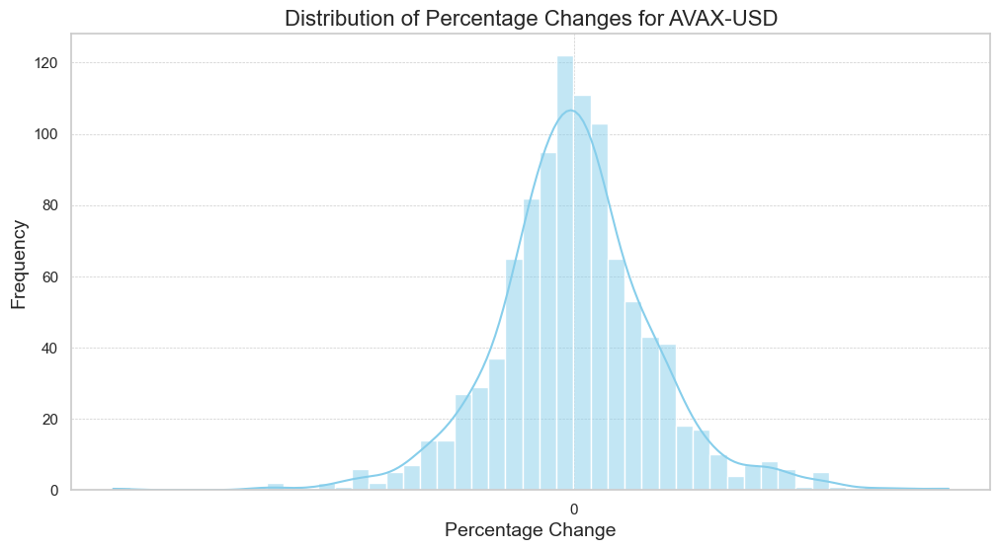

In [91]:
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker

# Setting the style
sns.set(style="whitegrid")

# Distribution of percentage changes per cryptocurrency
for coin in df_new_reset['product_id'].unique():
    plt.figure(figsize=(12, 6))
    ax = sns.histplot(df[df['product_id'] == coin]['pct_change'], kde=True, color='skyblue')
    
    # Formatting the plot
    ax.set_title(f'Distribution of Percentage Changes for {coin}', fontsize=16)
    ax.set_xlabel('Percentage Change', fontsize=14)
    ax.set_ylabel('Frequency', fontsize=14)
    
    # Handling extreme values by setting custom ticks based on data range
    pct_range = df_new_reset[df_new_reset['product_id'] == coin]['pct_change'].max() - df_new_reset[df_new_reset['product_id'] == coin]['pct_change'].min()
    if pct_range > 1000:
        major_tick = int(pct_range / 10)  # reduce number of major ticks for wide ranges
    else:
        major_tick = 50  # default tick setting for closer ranges
    
    ax.xaxis.set_major_locator(ticker.MultipleLocator(major_tick))
    ax.xaxis.set_minor_locator(ticker.MultipleLocator(major_tick / 5))  # smaller increments
    ax.xaxis.set_major_formatter(ticker.ScalarFormatter())

    # Add grid for better readability
    ax.grid(True, which='both', linestyle='--', linewidth=0.5)
    
    # Save the figure
    # plt.savefig(f'{coin}_pct_change_distribution.png')
    plt.show()
    # plt.close()


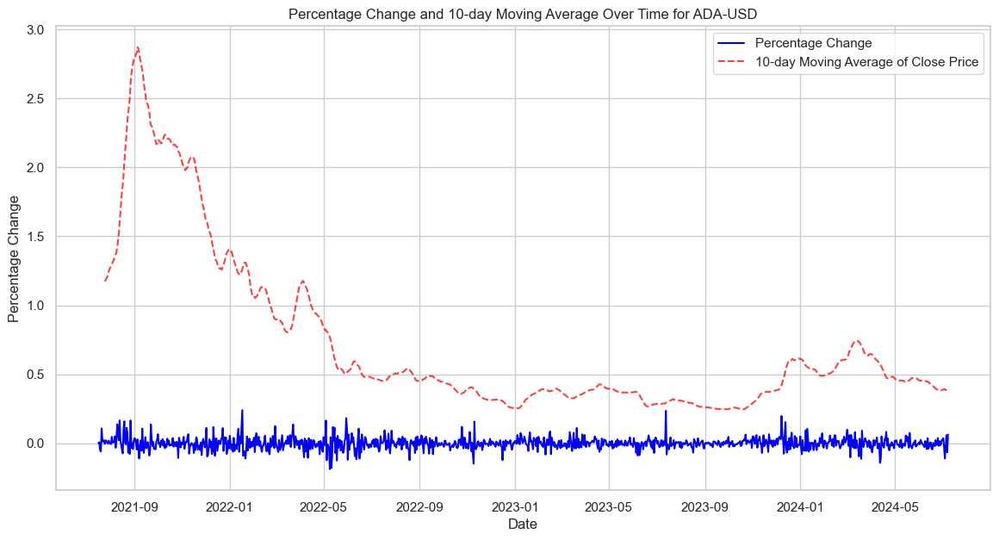

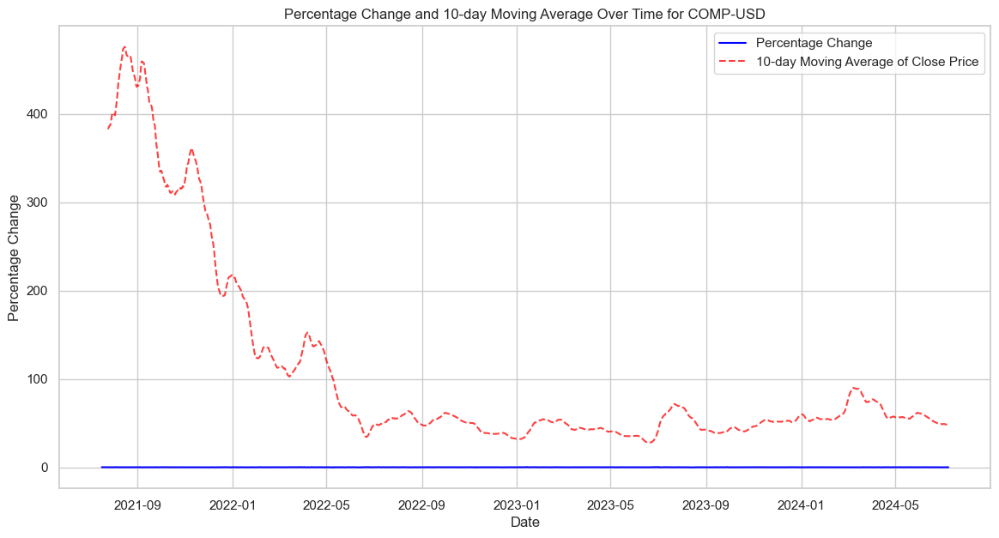

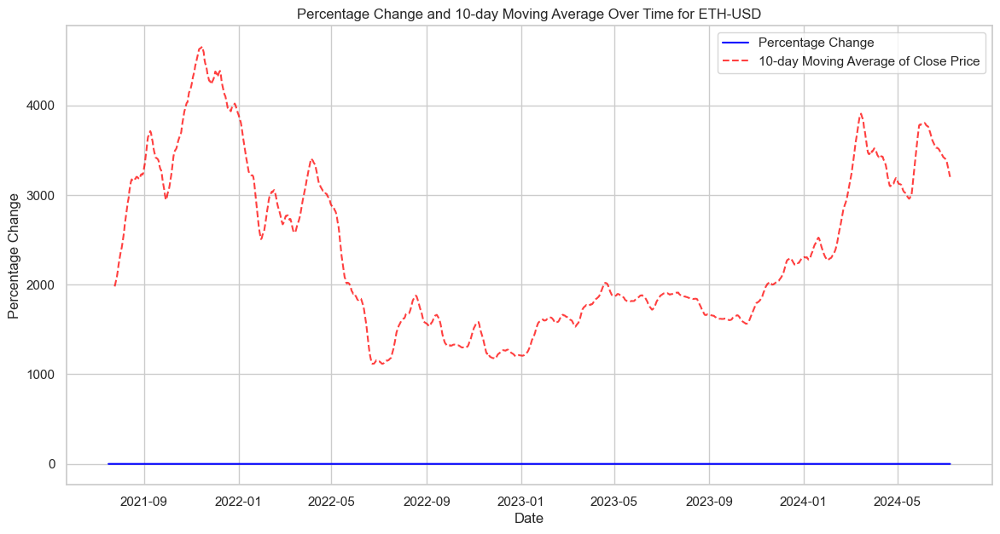

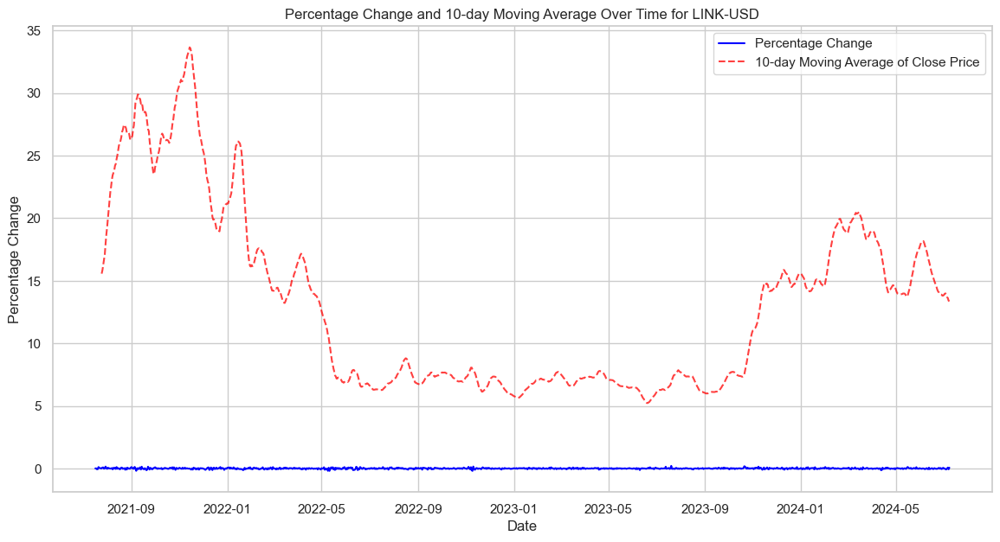

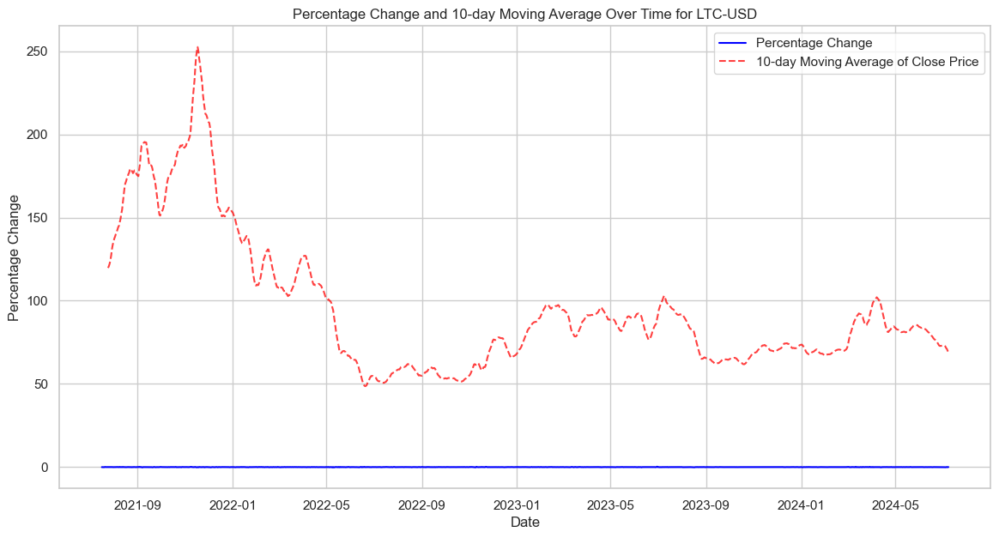

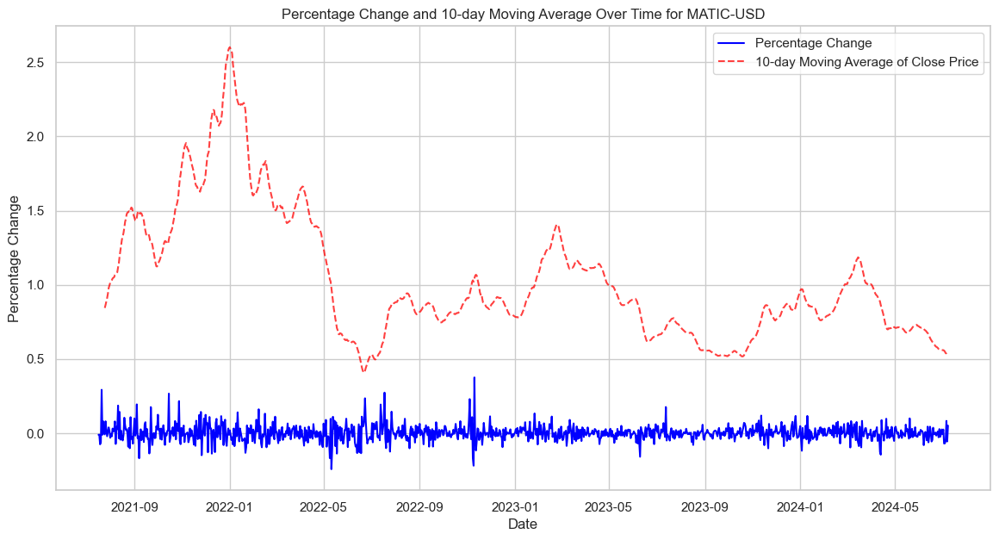

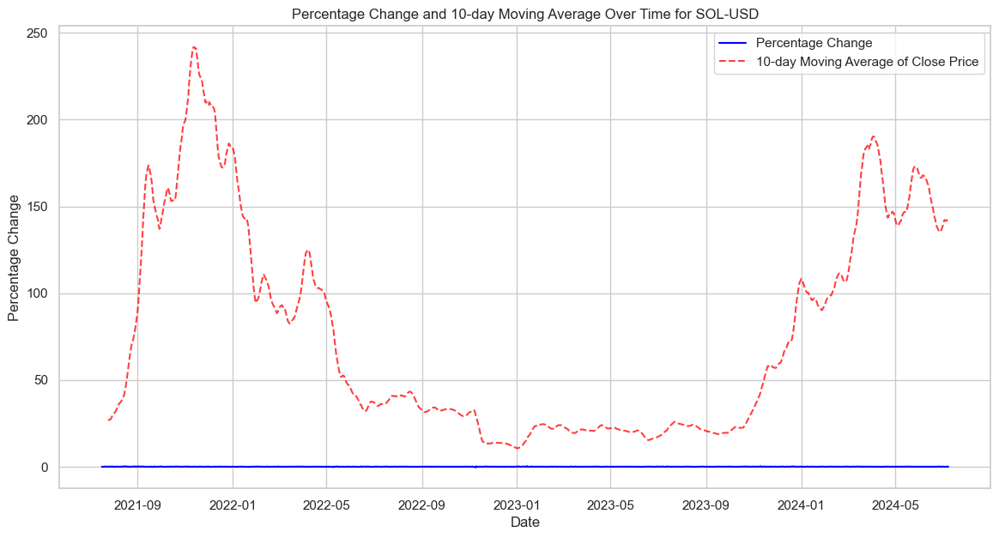

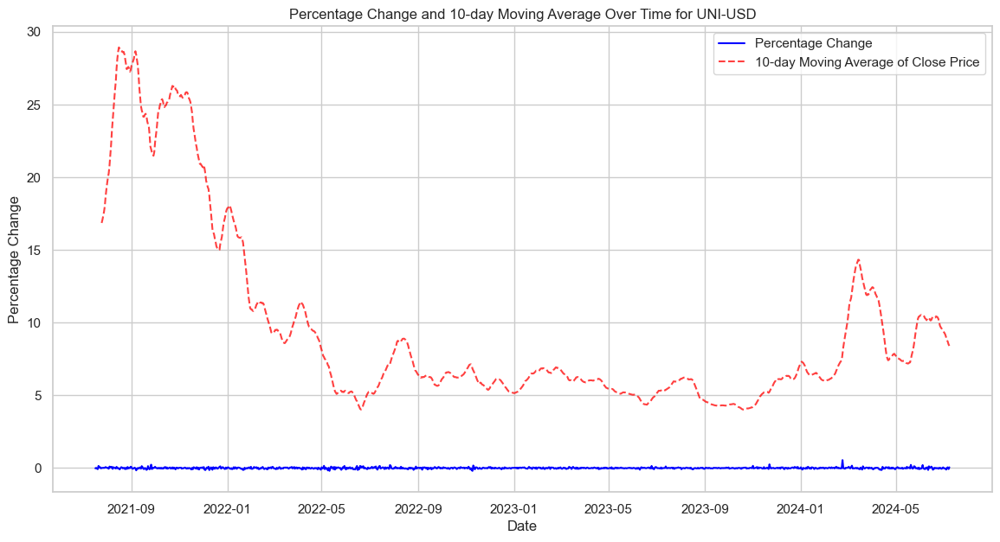

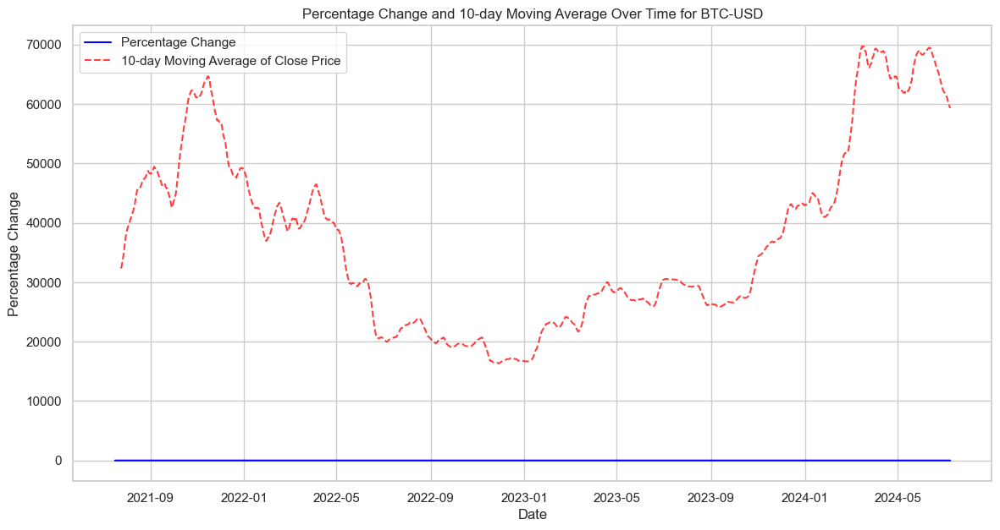

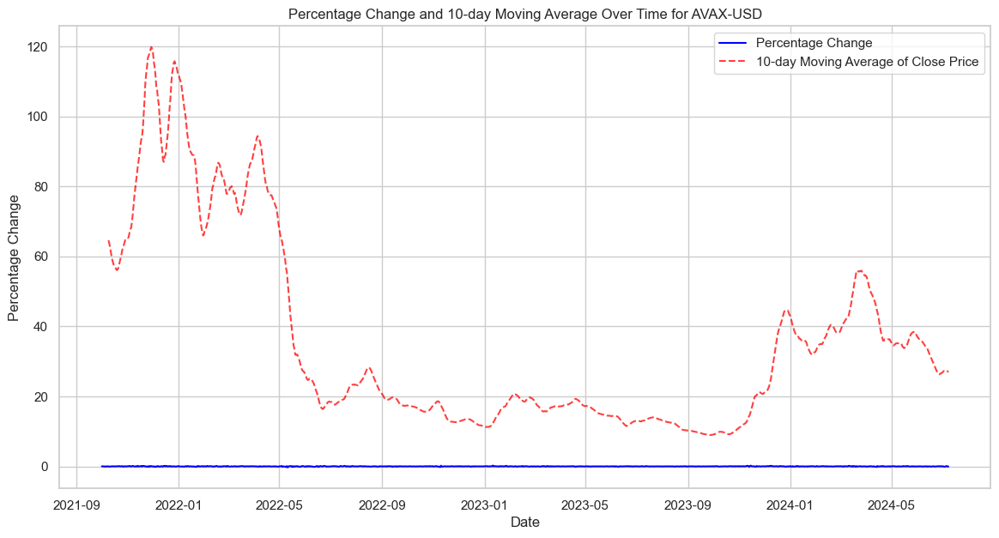

In [92]:
for coin in df_new_reset['product_id'].unique():
    plt.figure(figsize=(14, 7))
    coin_data = df_new_reset[df_new_reset['product_id'] == coin]
    plt.plot(coin_data.index, coin_data['pct_change'], label='Percentage Change', color='blue')
    plt.plot(coin_data.index, coin_data['close_MA10'], label='10-day Moving Average of Close Price', alpha=0.75, linestyle='--', color='red')
    plt.title(f'Percentage Change and 10-day Moving Average Over Time for {coin}')
    plt.xlabel('Date')
    plt.ylabel('Percentage Change')
    plt.legend()
    plt.show()

### Time Series of Percentage Change and Moving Average for Each Cryptocurrency

In [ ]:
# # Time Series of Percentage Change and Moving Average per cryptocurrency
# for coin in df['product_id'].unique():
#     plt.figure(figsize=(14, 7))
#     coin_data = df[df['product_id'] == coin]
#     plt.plot(coin_data.index, coin_data['pct_change'], label='Percentage Change', color='blue')
#     plt.plot(coin_data.index, coin_data['close_MA10'], label='10-day Moving Average of Close Price', alpha=0.75, linestyle='--', color='red')
#     plt.title(f'Percentage Change and 10-day Moving Average Over Time for {coin}')
#     plt.xlabel('Date')
#     plt.ylabel('Percentage Change')
#     plt.legend()
#     plt.show()

### Time Series of Percentage Changes and Moving Average for Each Cryptocurrency

In [93]:
print(df_new_reset.columns.tolist())

['product_id', 'low', 'high', 'open', 'close', 'volume', 'price_change', 'average_price', 'volatility', 'pct_change', 'day_of_week', 'day_name', 'close_lag_1', 'volume_lag_1', 'close_lag_3', 'volume_lag_3', 'close_lag_7', 'volume_lag_7', 'close_MA10', 'close_ema_7', 'close_ema_14', 'close_ema_30', 'RSI', 'MACD', 'Signal_Line', 'volatility_7d', 'volatility_14d', 'volatility_30d', 'momentum_1d', 'momentum_7d', 'momentum_30d']


In [94]:
print(df_new_reset.head())
print(df_new_reset.info())
print(df_new_reset.describe())

           product_id         low       high        open       close  \
time                                                                   
2021-07-16    ADA-USD     1.16610     1.2452     1.22490     1.17140   
2021-07-16   COMP-USD   367.10000   410.5000   398.45000   367.89000   
2021-07-16    ETH-USD  1850.15000  1965.3500  1918.99000  1877.22000   
2021-07-16   LINK-USD    15.13583    16.3345    15.77288    15.23963   
2021-07-16    LTC-USD   120.44000   127.8200   125.92000   120.68000   

                  volume  price_change  average_price  volatility  pct_change  \
time                                                                            
2021-07-16  3.676491e+07      -0.05350       1.205650    6.783295         NaN   
2021-07-16  2.381554e+04     -30.56000     388.800000   11.822392         NaN   
2021-07-16  1.842217e+05     -41.77000    1907.750000    6.226522         NaN   
2021-07-16  2.246281e+06      -0.53325      15.735165    7.919420         NaN   
2021-07-1

### Dashboard

In [ ]:
#app.run_server(port=8051)
#if __name__ == '__main__':
#    app.run_server(port=8051)
# import dash
# import dash_html_components as html
# import dash_core_components as dcc

# app = dash.Dash(__name__)

# app.layout = html.Div([
#     # Header
#     html.Div([
#         html.H1("Crypto Price Analyzer"),
#         html.P("Select a product ID and date range to analyze:")
#     ]),
    
#     # Main Content
#     html.Div([
#         # Graphs and charts will go here
#     ]),
    
#     # Sidebar
#     html.Div([
#         # Settings and controls will go here
#     ])
# ])

# if __name__ == '__main__':
#     app.run_server(port=8051)

### Correlation Matrix of Numeric Features for Each Cryptocurrency

In [96]:
num_features = df_new_reset.select_dtypes(include=[np.number]).shape[1]
print(f"Number of numerical features: {num_features}")

Number of numerical features: 29


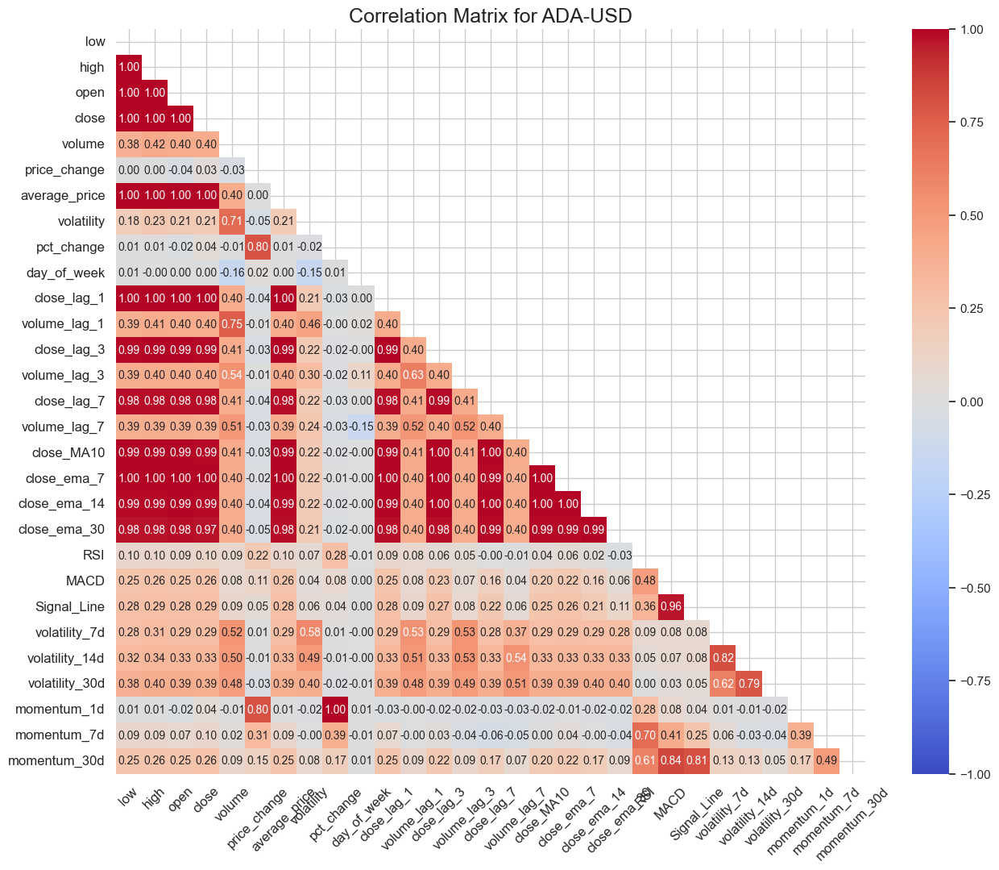

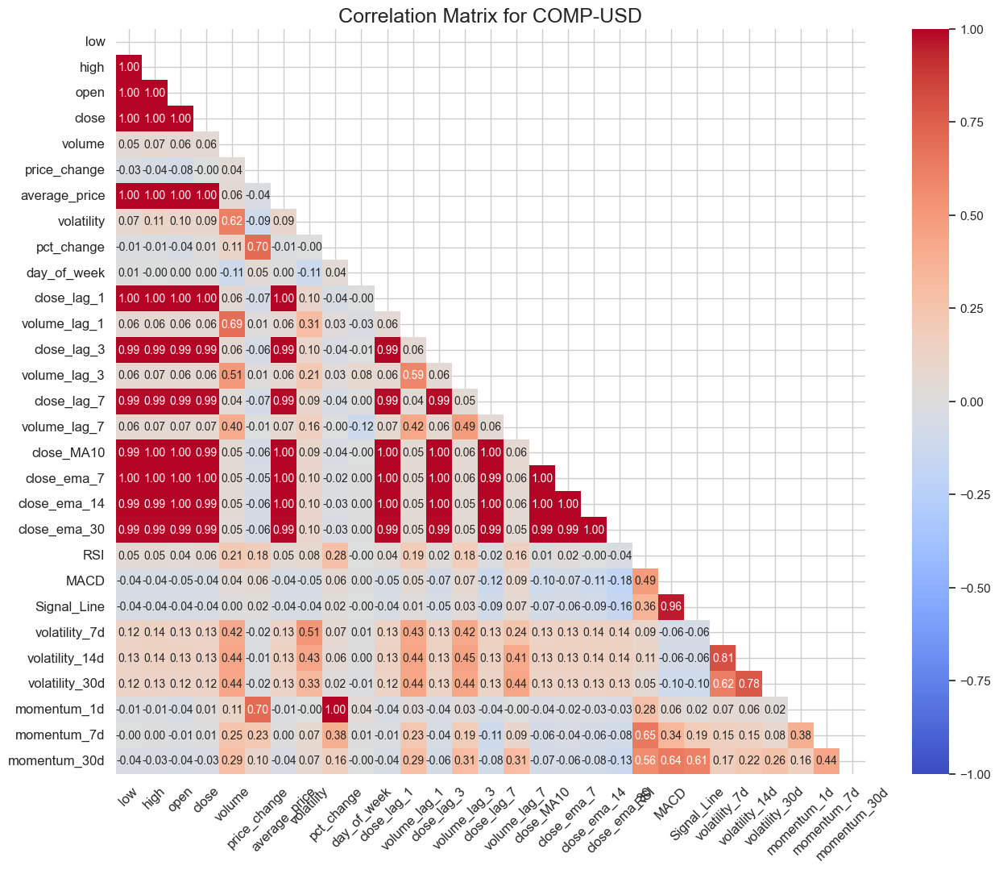

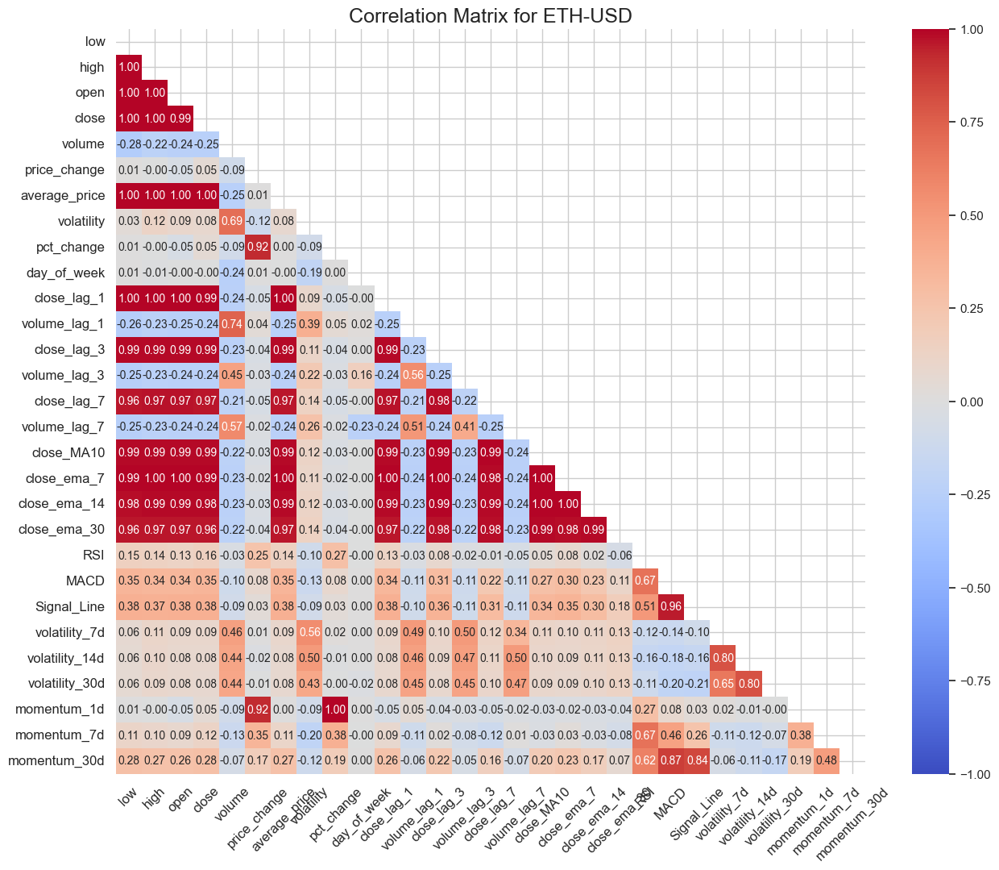

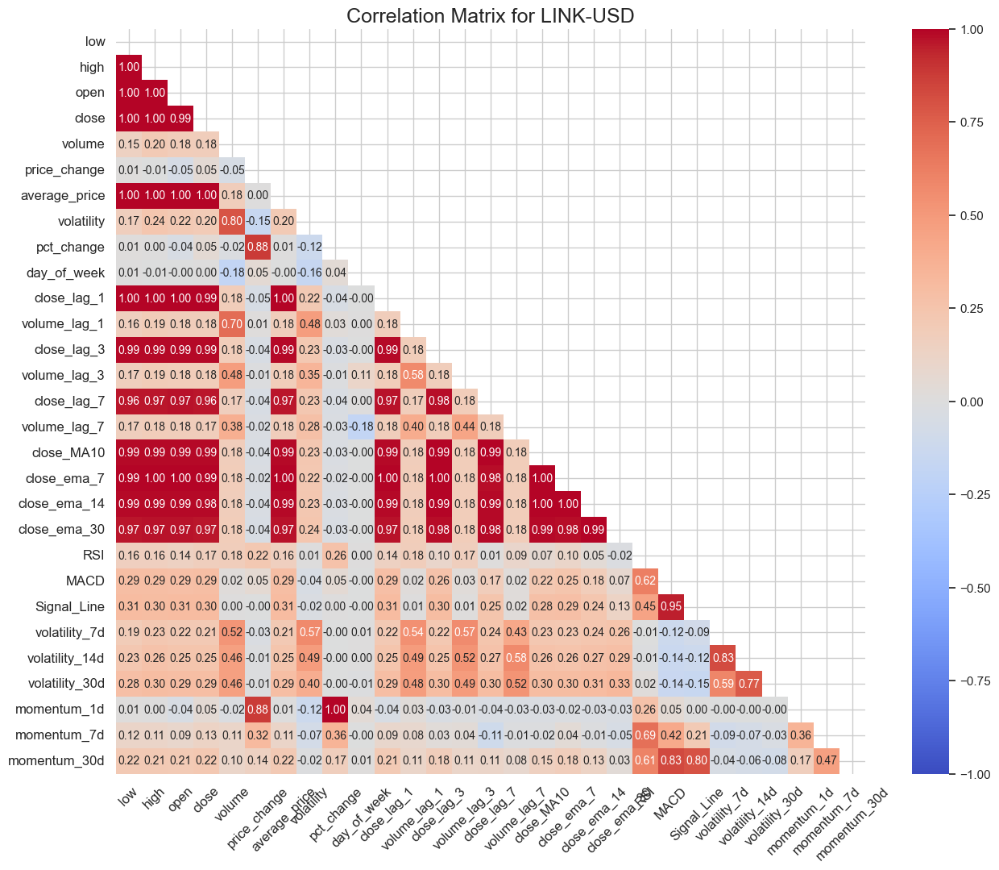

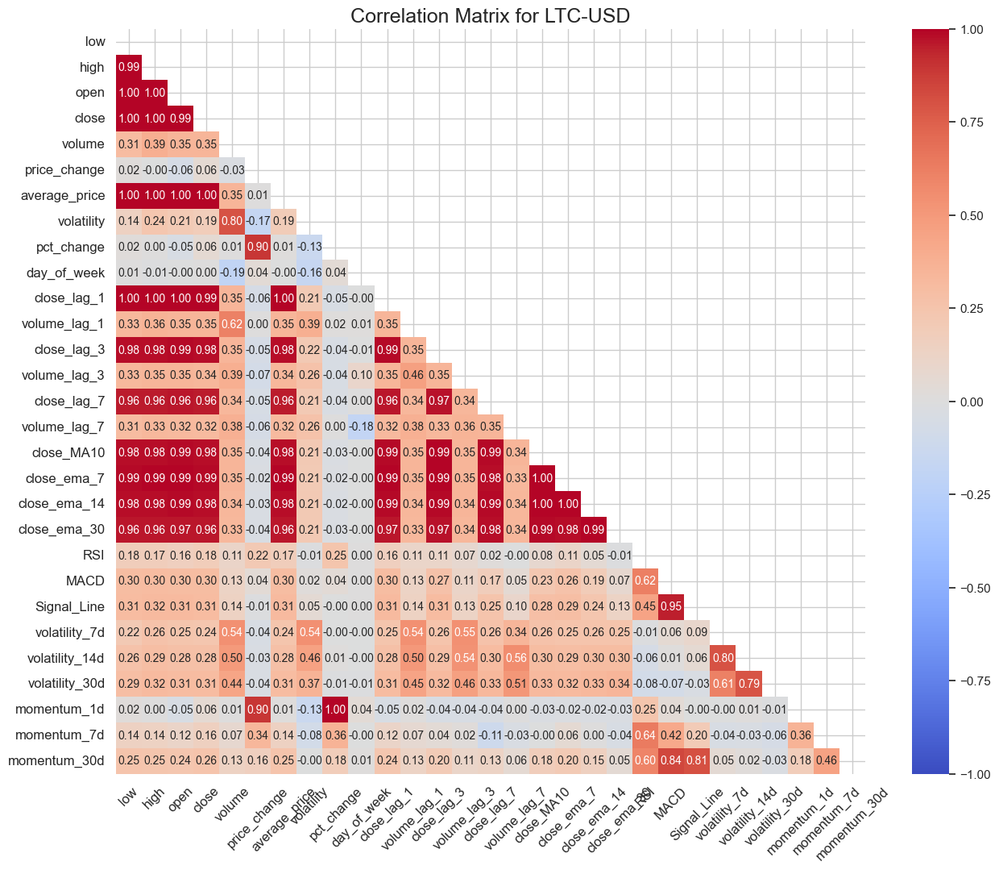

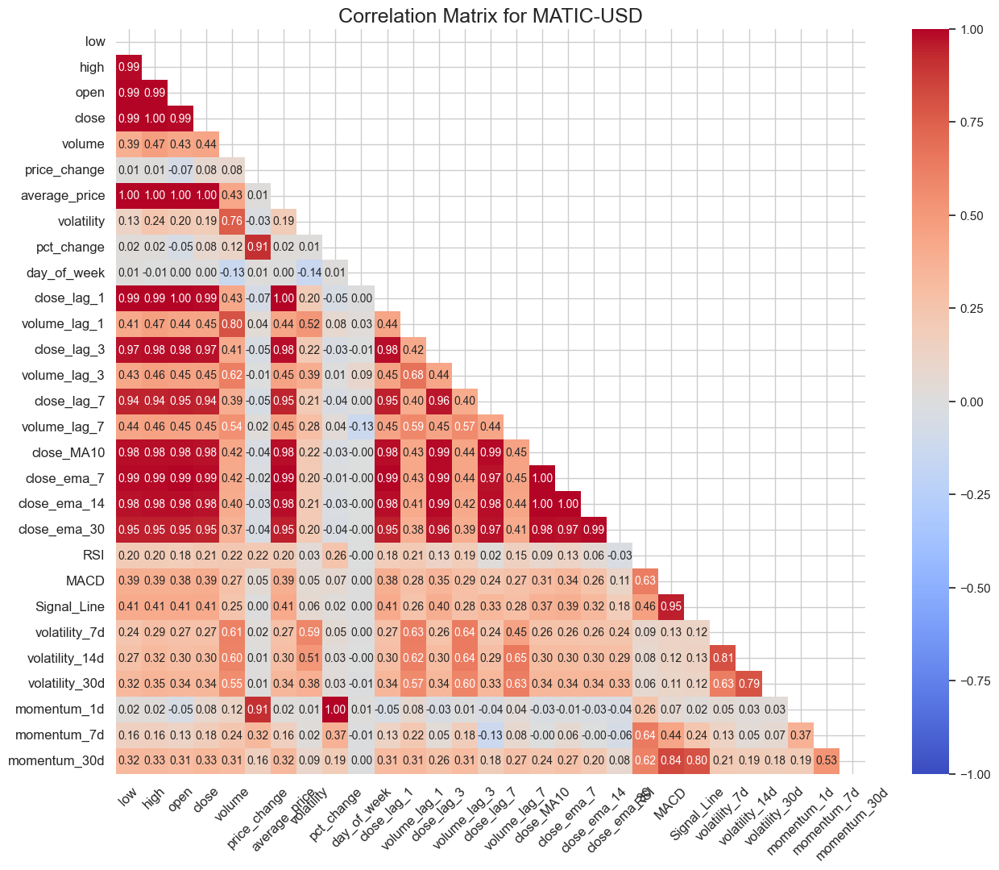

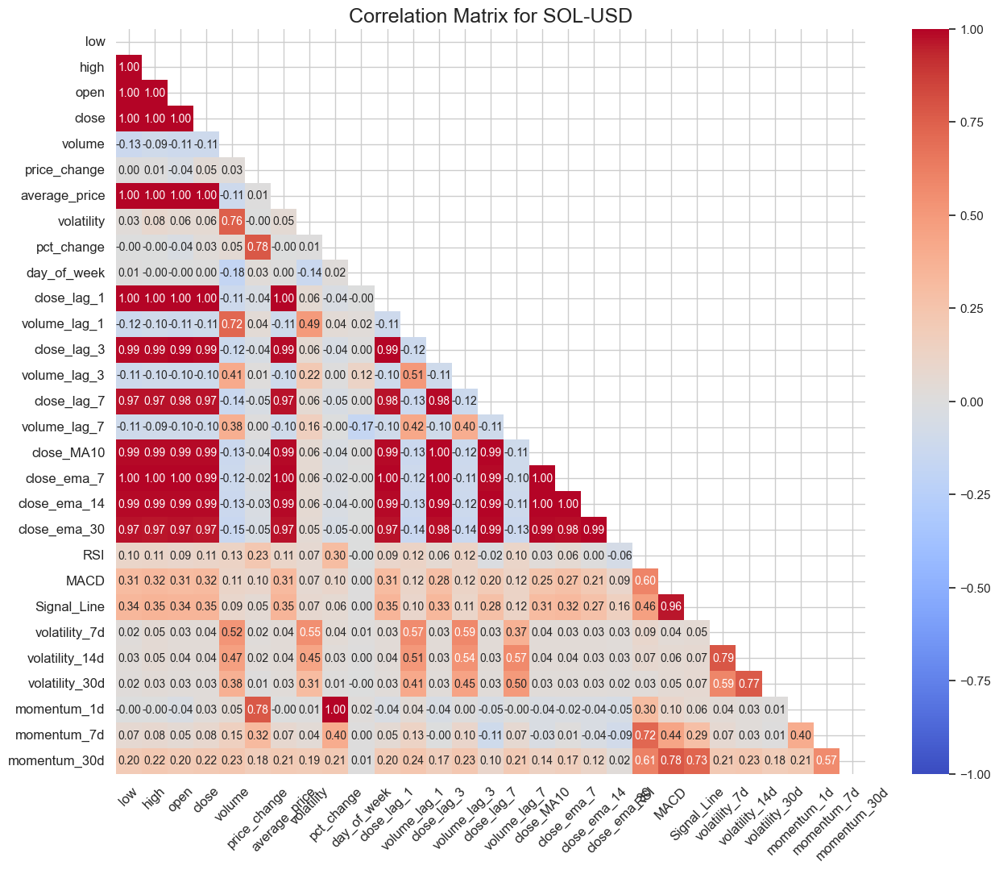

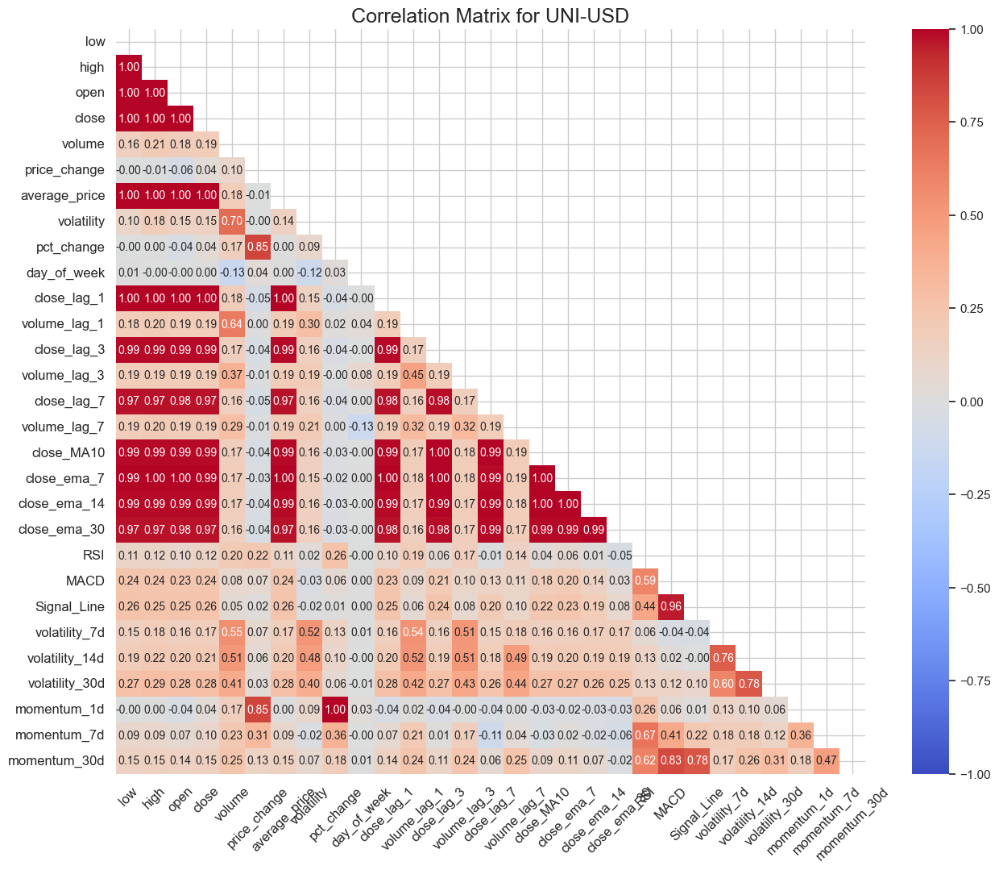

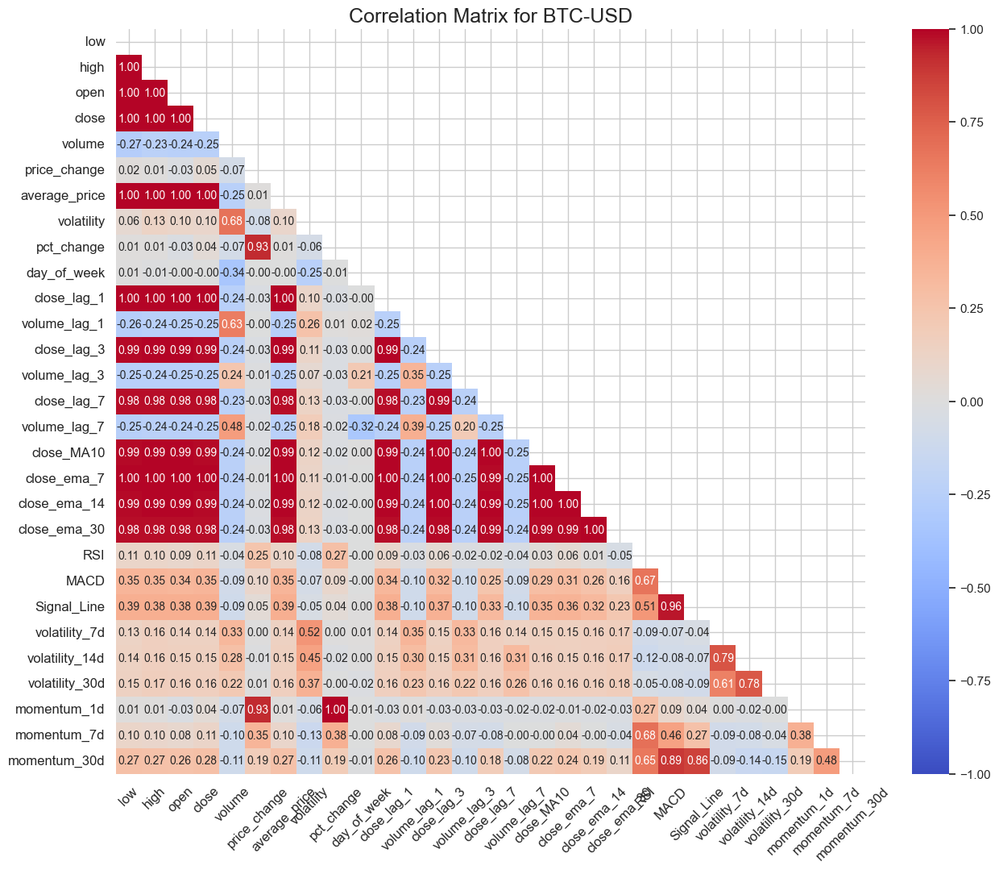

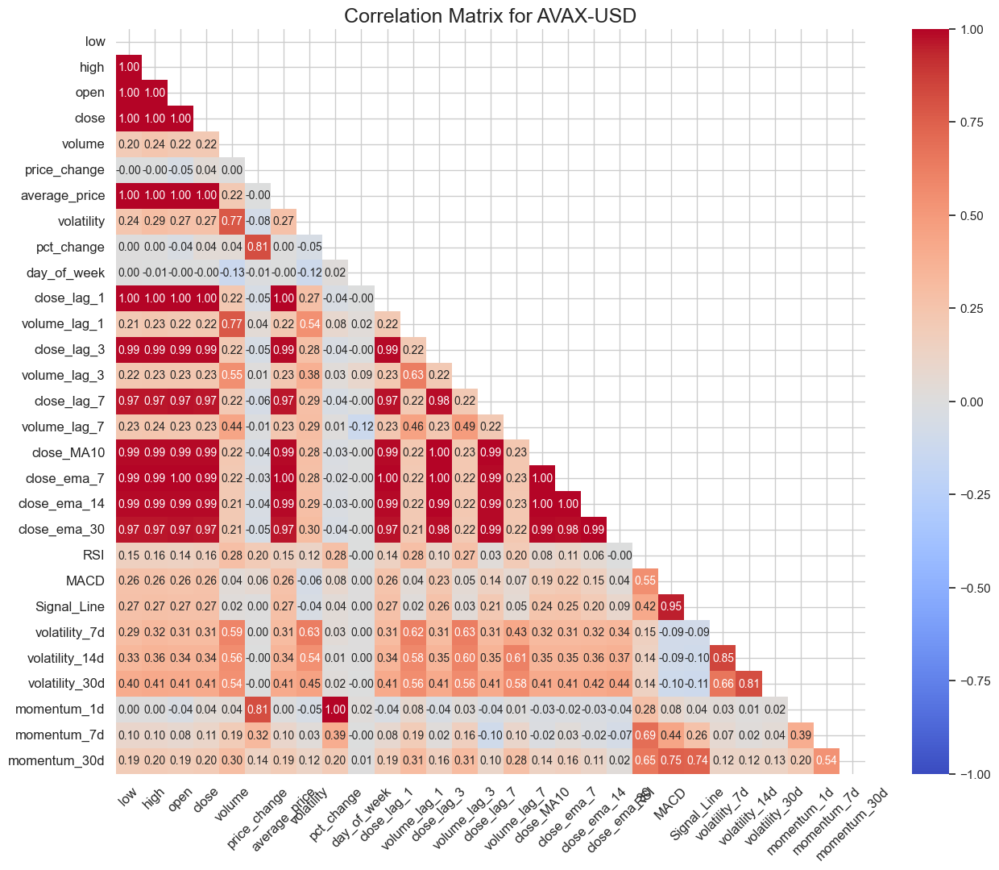

In [97]:
for coin in df_new_reset['product_id'].unique():
    plt.figure(figsize=(15, 12))  # Adjusted figure size for 30 numerical features
    coin_data = df_new_reset[df_new_reset['product_id'] == coin].select_dtypes(include=[np.number])
    corr_matrix = coin_data.corr()
    
    # Generate a heatmap with upper triangle masked
    mask = np.triu(np.ones_like(corr_matrix, dtype=bool))
    sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt=".2f", vmin=-1, vmax=1, mask=mask, annot_kws={'fontsize': 10})  # Adjusted annotation font size
    
    plt.title(f'Correlation Matrix for {coin}', fontsize=18)  # Increased title font size
    plt.xticks(rotation=45, fontsize=12)  # Increased x-axis font size
    plt.yticks(rotation=0, fontsize=12)  # Increased y-axis font size
    plt.savefig(f'pictures/{coin}_pct_change_distribution.png')
    plt.show()

In [98]:
# Dictionary to hold correlation matrices
correlation_matrices = {}

# Calculate and store correlation matrices for each cryptocurrency
for coin in df_new_reset['product_id'].unique():
    # Filter data for the current cryptocurrency and select numeric types
    coin_data = df_new_reset[df_new_reset['product_id'] == coin].select_dtypes(include=[np.number])
    correlation_matrices[coin] = coin_data.corr()

# Option 1: Display each matrix as a DataFrame in Jupyter Notebook
for coin, matrix in correlation_matrices.items():
    print(f"Correlation Matrix for {coin}:")
    display(matrix)  # This uses IPython.display.display to show DataFrames nicely in Jupyter

# # Option 2: Export each matrix to a CSV file
# for coin, matrix in correlation_matrices.items():
#     matrix.to_csv(f'correlation_matrix_{coin}.csv')


Correlation Matrix for ADA-USD:


,low,high,open,close,volume,price_change,average_price,volatility,pct_change,day_of_week,close_lag_1,volume_lag_1,close_lag_3,volume_lag_3,close_lag_7,volume_lag_7,close_MA10,close_ema_7,close_ema_14,close_ema_30,RSI,MACD,Signal_Line,volatility_7d,volatility_14d,volatility_30d,momentum_1d,momentum_7d,momentum_30d
low,1.000000,0.997422,0.997611,0.998219,0.379823,0.002513,0.999299,0.177034,0.011390,0.006314,0.997579,0.389902,0.991917,0.394310,0.981428,0.387338,0.992294,0.996164,0.990771,0.976230,0.095532,0.251083,0.275654,0.279545,0.319325,0.381644,0.011390,0.087905,0.247790
high,0.997422,1.000000,0.998435,0.998870,0.418751,0.000312,0.999409,0.231445,0.011301,-0.002670,0.998372,0.409691,0.992857,0.403121,0.982026,0.394422,0.993212,0.997040,0.991341,0.975760,0.098147,0.260134,0.286445,0.305826,0.339690,0.396870,0.011301,0.089883,0.255699
open,0.997611,0.998435,1.000000,0.996887,0.403459,-0.044654,0.998683,0.211782,-0.024144,0.000366,0.999981,0.400790,0.993914,0.399099,0.983693,0.391771,0.994281,0.997635,0.992605,0.977800,0.086991,0.252528,0.281018,0.292751,0.330683,0.390667,-0.024144,0.074203,0.246195
close,0.998219,0.998870,0.996887,1.000000,0.401146,0.034246,0.999202,0.208116,0.039181,0.002169,0.996809,0.399848,0.991615,0.398804,0.980668,0.389447,0.992101,0.996236,0.990217,0.974564,0.104218,0.261296,0.285340,0.293447,0.329838,0.389470,0.039181,0.098949,0.258278
volume,0.379823,0.418751,0.403459,0.401146,1.000000,-0.031415,0.400376,0.708825,-0.014074,-0.155658,0.403577,0.753404,0.406859,0.543373,0.405378,0.508177,0.409569,0.404851,0.403048,0.400378,0.085557,0.084842,0.087534,0.524125,0.496492,0.477700,-0.014074,0.019986,0.093474
price_change,0.002513,0.000312,-0.044654,0.034246,-0.031415,1.000000,0.001366,-0.047554,0.802770,0.022845,-0.044580,-0.013698,-0.033656,-0.005559,-0.043063,-0.031374,-0.033203,-0.022931,-0.035431,-0.046105,0.218081,0.109787,0.053310,0.007481,-0.012888,-0.031294,0.802770,0.314279,0.146489
average_price,0.999299,0.999409,0.998683,0.999202,0.400376,0.001366,1.000000,0.205534,0.011351,0.001631,0.998635,0.400477,0.993046,0.399161,0.982369,0.391282,0.993409,0.997262,0.991706,0.976613,0.096957,0.255967,0.281461,0.293435,0.330155,0.389829,0.011351,0.088993,0.252073
volatility,0.177034,0.231445,0.211782,0.208116,0.708825,-0.047554,0.205534,1.000000,-0.016248,-0.153400,0.211567,0.459444,0.217236,0.298034,0.217378,0.235846,0.218419,0.215076,0.216135,0.214750,0.066537,0.038576,0.055543,0.581067,0.494184,0.395880,-0.016248,-0.004062,0.078681
pct_change,0.011390,0.011301,-0.024144,0.039181,-0.014074,0.802770,0.011351,-0.016248,1.000000,0.005327,-0.025204,-0.004677,-0.018669,-0.018832,-0.025192,-0.032963,-0.017208,-0.007571,-0.016876,-0.024563,0.282034,0.079790,0.037119,0.014404,-0.013197,-0.019241,1.000000,0.386888,0.166969
day_of_week,0.006314,-0.002670,0.000366,0.002169,-0.155658,0.022845,0.001631,-0.153400,0.005327,1.000000,0.000181,0.018461,-0.004551,0.105955,0.002731,-0.147148,-0.001368,-0.000173,-0.000477,-0.000763,-0.006244,0.002621,0.001370,-0.000809,-0.003360,-0.009928,0.005327,-0.008772,0.006146


Correlation Matrix for COMP-USD:


,low,high,open,close,volume,price_change,average_price,volatility,pct_change,day_of_week,close_lag_1,volume_lag_1,close_lag_3,volume_lag_3,close_lag_7,volume_lag_7,close_MA10,close_ema_7,close_ema_14,close_ema_30,RSI,MACD,Signal_Line,volatility_7d,volatility_14d,volatility_30d,momentum_1d,momentum_7d,momentum_30d
low,1.000000,0.998128,0.998016,0.998717,0.046925,-0.030482,0.999487,0.069514,-0.010634,0.006723,0.998009,0.055962,0.993149,0.062954,0.986021,0.062880,0.994497,0.997279,0.994183,0.987089,0.052379,-0.042259,-0.040172,0.122483,0.125368,0.119813,-0.010634,-0.000278,-0.036676
high,0.998128,1.000000,0.998880,0.998613,0.069880,-0.043142,0.999574,0.110622,-0.014386,-0.000928,0.998874,0.064570,0.993925,0.065846,0.986564,0.067235,0.995172,0.997874,0.994886,0.987810,0.054138,-0.043151,-0.040046,0.139897,0.139610,0.129634,-0.014386,0.001124,-0.034838
open,0.998016,0.998880,1.000000,0.997077,0.057064,-0.077837,0.998935,0.096883,-0.041031,0.001103,0.999999,0.060035,0.994512,0.063618,0.987467,0.065399,0.995691,0.998096,0.995370,0.988496,0.044764,-0.046437,-0.041573,0.132580,0.132956,0.124738,-0.041031,-0.010364,-0.040939
close,0.998717,0.998613,0.997077,1.000000,0.060253,-0.001443,0.999129,0.089921,0.012036,0.004707,0.997092,0.061225,0.992762,0.064512,0.985873,0.065132,0.994408,0.997245,0.994095,0.986982,0.058581,-0.042082,-0.040488,0.131860,0.132554,0.124129,0.012036,0.007229,-0.033334
volume,0.046925,0.069880,0.057064,0.060253,1.000000,0.039361,0.058965,0.621976,0.114316,-0.107156,0.057865,0.691214,0.055587,0.507447,0.041767,0.403592,0.050154,0.052875,0.048727,0.046666,0.211615,0.038504,0.004906,0.419104,0.438868,0.436810,0.114316,0.252610,0.287512
price_change,-0.030482,-0.043142,-0.077837,-0.001443,0.039361,1.000000,-0.037124,-0.094698,0.696077,0.046980,-0.069972,0.013657,-0.057764,0.009414,-0.067585,-0.006613,-0.063114,-0.050730,-0.056156,-0.059010,0.177500,0.058679,0.015804,-0.015750,-0.011032,-0.018582,0.696077,0.232894,0.100208
average_price,0.999487,0.999574,0.998935,0.999129,0.058965,-0.037124,1.000000,0.091069,-0.012603,0.002721,0.998931,0.060495,0.994025,0.064498,0.986767,0.065188,0.995322,0.998057,0.995015,0.987928,0.053325,-0.042746,-0.040125,0.131653,0.132882,0.125019,-0.012603,0.000456,-0.035733
volatility,0.069514,0.110622,0.096883,0.089921,0.621976,-0.094698,0.091069,1.000000,-0.001420,-0.110734,0.095934,0.309253,0.099460,0.213779,0.090465,0.162029,0.091368,0.096725,0.098500,0.100766,0.075627,-0.045469,-0.039332,0.514279,0.429995,0.327133,-0.001420,0.074173,0.065281
pct_change,-0.010634,-0.014386,-0.041031,0.012036,0.114316,0.696077,-0.012603,-0.001420,1.000000,0.041401,-0.041025,0.025412,-0.035538,0.027786,-0.041028,-0.003734,-0.036375,-0.024785,-0.029984,-0.033127,0.279577,0.058119,0.018971,0.069278,0.058289,0.022587,1.000000,0.384401,0.159859
day_of_week,0.006723,-0.000928,0.001103,0.004707,-0.107156,0.046980,0.002721,-0.110734,0.041401,1.000000,-0.000098,-0.031269,-0.007560,0.075887,0.004420,-0.115643,-0.002619,0.001239,0.000842,0.000638,-0.002108,0.003172,-0.000093,0.006255,0.002236,-0.012122,0.041401,0.005757,-0.000280


Correlation Matrix for ETH-USD:


,low,high,open,close,volume,price_change,average_price,volatility,pct_change,day_of_week,close_lag_1,volume_lag_1,close_lag_3,volume_lag_3,close_lag_7,volume_lag_7,close_MA10,close_ema_7,close_ema_14,close_ema_30,RSI,MACD,Signal_Line,volatility_7d,volatility_14d,volatility_30d,momentum_1d,momentum_7d,momentum_30d
low,1.000000,0.995939,0.996320,0.997324,-0.275515,0.011899,0.998918,0.034853,0.007628,0.007765,0.996310,-0.261349,0.985066,-0.250312,0.964467,-0.252549,0.985201,0.992968,0.983855,0.961508,0.149021,0.351317,0.381641,0.064806,0.058764,0.061348,0.007628,0.114563,0.275802
high,0.995939,1.000000,0.997924,0.997619,-0.220509,-0.000787,0.999048,0.117574,-0.000832,-0.010002,0.997919,-0.233366,0.988689,-0.233435,0.969644,-0.230364,0.989132,0.995747,0.987829,0.966953,0.140626,0.340156,0.373697,0.107462,0.095135,0.091609,-0.000832,0.099876,0.265276
open,0.996320,0.997924,1.000000,0.994680,-0.238215,-0.049409,0.998161,0.091399,-0.047450,-0.002649,0.999988,-0.247655,0.989667,-0.238657,0.970334,-0.239572,0.989727,0.995971,0.988320,0.967420,0.129041,0.339870,0.375168,0.088904,0.079912,0.078488,-0.047450,0.085590,0.258789
close,0.997324,0.997619,0.994680,1.000000,-0.247905,0.053742,0.998490,0.078797,0.047880,-0.002055,0.994678,-0.243804,0.985313,-0.241244,0.965166,-0.241146,0.985851,0.993546,0.984576,0.962622,0.155044,0.348488,0.378537,0.089437,0.078155,0.077823,0.047880,0.121729,0.276320
volume,-0.275515,-0.220509,-0.238215,-0.247905,1.000000,-0.094468,-0.247379,0.693577,-0.088581,-0.242766,-0.238242,0.739636,-0.226756,0.454760,-0.211784,0.574576,-0.224151,-0.232753,-0.226895,-0.218784,-0.033154,-0.103080,-0.093527,0.461214,0.441191,0.437461,-0.088581,-0.128052,-0.068408
price_change,0.011899,-0.000787,-0.049409,0.053742,-0.094468,1.000000,0.005358,-0.121983,0.924141,0.005750,-0.049519,0.036846,-0.040199,-0.025550,-0.047669,-0.015910,-0.034630,-0.021347,-0.034157,-0.044419,0.253245,0.084289,0.033477,0.005415,-0.016829,-0.006626,0.924141,0.351270,0.172418
average_price,0.998918,0.999048,0.998161,0.998490,-0.247379,0.005358,1.000000,0.077621,0.003266,-0.001406,0.998154,-0.247159,0.987939,-0.241848,0.968118,-0.241344,0.988229,0.995412,0.986908,0.965298,0.144835,0.345908,0.377925,0.086908,0.077613,0.077039,0.003266,0.107092,0.270640
volatility,0.034853,0.117574,0.091399,0.078797,0.693577,-0.121983,0.077621,1.000000,-0.093226,-0.192408,0.091547,0.386688,0.113328,0.215823,0.137213,0.261335,0.121838,0.106142,0.120558,0.139771,-0.101047,-0.127488,-0.091257,0.561274,0.495049,0.425509,-0.093226,-0.200252,-0.117024
pct_change,0.007628,-0.000832,-0.047450,0.047880,-0.088581,0.924141,0.003266,-0.093226,1.000000,0.003568,-0.047737,0.049562,-0.040961,-0.025973,-0.047044,-0.019228,-0.034855,-0.022727,-0.034940,-0.044753,0.274145,0.080022,0.031678,0.020418,-0.014725,-0.000788,1.000000,0.375940,0.185270
day_of_week,0.007765,-0.010002,-0.002649,-0.002055,-0.242766,0.005750,-0.001406,-0.192408,0.003568,1.000000,-0.002539,0.018752,0.004035,0.161786,-0.001240,-0.232997,-0.000343,-0.001206,-0.001229,-0.001678,-0.003169,0.002801,0.003993,0.004400,0.000790,-0.015806,0.003568,-0.003258,0.000184


Correlation Matrix for LINK-USD:


,low,high,open,close,volume,price_change,average_price,volatility,pct_change,day_of_week,close_lag_1,volume_lag_1,close_lag_3,volume_lag_3,close_lag_7,volume_lag_7,close_MA10,close_ema_7,close_ema_14,close_ema_30,RSI,MACD,Signal_Line,volatility_7d,volatility_14d,volatility_30d,momentum_1d,momentum_7d,momentum_30d
low,1.000000,0.996207,0.996156,0.997561,0.147112,0.011581,0.998957,0.165363,0.011332,0.005856,0.996157,0.160680,0.985698,0.169974,0.964920,0.167276,0.986002,0.993534,0.985153,0.966684,0.160339,0.293891,0.307379,0.194921,0.231699,0.283017,0.011332,0.116366,0.217194
high,0.996207,1.000000,0.997824,0.997394,0.203926,-0.005701,0.999141,0.238853,0.000870,-0.007385,0.997832,0.189684,0.987743,0.188609,0.967150,0.182884,0.987985,0.995151,0.987265,0.969300,0.157090,0.289470,0.304662,0.229500,0.259761,0.304409,0.000870,0.111125,0.214106
open,0.996156,0.997824,1.000000,0.994361,0.182398,-0.054751,0.997975,0.217822,-0.043486,-0.003882,0.999997,0.176777,0.989295,0.182524,0.969240,0.177225,0.989538,0.995864,0.988573,0.970852,0.144548,0.286735,0.305306,0.215884,0.247806,0.294999,-0.043486,0.092757,0.205581
close,0.997561,0.997394,0.994361,1.000000,0.176814,0.051448,0.998419,0.201566,0.049705,0.001861,0.994375,0.178325,0.985027,0.181533,0.964918,0.174629,0.985694,0.993455,0.984998,0.966701,0.167722,0.292627,0.304973,0.213196,0.247006,0.294538,0.049705,0.126353,0.220947
volume,0.147112,0.203926,0.182398,0.176814,1.000000,-0.052880,0.177067,0.795146,-0.016091,-0.179960,0.182540,0.700108,0.182188,0.484339,0.170924,0.384952,0.178434,0.179980,0.178152,0.179970,0.176570,0.022474,0.003716,0.518330,0.462279,0.461403,-0.016091,0.108988,0.104372
price_change,0.011581,-0.005701,-0.054751,0.051448,-0.052880,1.000000,0.002522,-0.153416,0.877657,0.054077,-0.054383,0.014320,-0.041704,-0.009608,-0.042601,-0.024854,-0.038462,-0.024337,-0.035295,-0.040698,0.218798,0.054999,-0.003641,-0.025784,-0.008676,-0.010038,0.877657,0.317269,0.141963
average_price,0.998957,0.999141,0.997975,0.998419,0.177067,0.002522,1.000000,0.204088,0.005852,-0.001088,0.997980,0.176054,0.987704,0.179915,0.967001,0.175625,0.987973,0.995324,0.987195,0.968973,0.158784,0.291849,0.306244,0.213252,0.246643,0.294510,0.005852,0.113725,0.215781
volatility,0.165363,0.238853,0.217822,0.201566,0.795146,-0.153416,0.204088,1.000000,-0.119033,-0.158692,0.217925,0.482188,0.225777,0.345965,0.230920,0.279416,0.227897,0.221853,0.229126,0.238103,0.005696,-0.044563,-0.023479,0.573547,0.491727,0.395457,-0.119033,-0.074737,-0.015214
pct_change,0.011332,0.000870,-0.043486,0.049705,-0.016091,0.877657,0.005852,-0.119033,1.000000,0.039825,-0.043412,0.028906,-0.034904,-0.012975,-0.035216,-0.026134,-0.030918,-0.017702,-0.027674,-0.033019,0.258186,0.053482,0.001672,-0.002633,-0.001097,-0.001009,1.000000,0.358367,0.165368
day_of_week,0.005856,-0.007385,-0.003882,0.001861,-0.179960,0.054077,-0.001088,-0.158692,0.039825,1.000000,-0.004118,0.003917,-0.004235,0.106263,0.001735,-0.182351,-0.002034,-0.001518,-0.001289,-0.000897,0.001436,-0.003915,-0.003702,0.005295,0.003265,-0.008103,0.039825,-0.004186,0.007967


Correlation Matrix for LTC-USD:


,low,high,open,close,volume,price_change,average_price,volatility,pct_change,day_of_week,close_lag_1,volume_lag_1,close_lag_3,volume_lag_3,close_lag_7,volume_lag_7,close_MA10,close_ema_7,close_ema_14,close_ema_30,RSI,MACD,Signal_Line,volatility_7d,volatility_14d,volatility_30d,momentum_1d,momentum_7d,momentum_30d
low,1.000000,0.994136,0.995123,0.997063,0.309402,0.017235,0.998384,0.144230,0.018877,0.007683,0.995114,0.331192,0.979637,0.334461,0.956677,0.308712,0.982280,0.991719,0.982377,0.962637,0.176249,0.302593,0.311084,0.218552,0.259516,0.293136,0.018877,0.144627,0.251066
high,0.994136,1.000000,0.996536,0.995955,0.387813,-0.004019,0.998674,0.239602,0.004363,-0.008700,0.996527,0.360699,0.981278,0.350657,0.958040,0.328424,0.983483,0.992599,0.983417,0.963303,0.172719,0.304799,0.315736,0.263557,0.294750,0.319261,0.004363,0.137423,0.249526
open,0.995123,0.996536,1.000000,0.992962,0.349026,-0.058440,0.997324,0.206640,-0.046346,-0.002664,0.999995,0.345957,0.985805,0.348185,0.961903,0.323641,0.986742,0.994832,0.986497,0.967097,0.157294,0.298978,0.313201,0.245615,0.280267,0.309734,-0.046346,0.116242,0.237536
close,0.997063,0.995955,0.992962,1.000000,0.345569,0.060200,0.997942,0.186329,0.059828,0.002143,0.992964,0.345927,0.979093,0.339234,0.955768,0.316880,0.982075,0.991798,0.982320,0.962436,0.183169,0.303600,0.311748,0.240299,0.276554,0.305788,0.059828,0.156089,0.256635
volume,0.309402,0.387813,0.349026,0.345569,1.000000,-0.028835,0.351057,0.803334,0.005918,-0.187993,0.349686,0.615921,0.345228,0.385456,0.339694,0.379679,0.347951,0.346063,0.341542,0.331393,0.114861,0.129606,0.135225,0.542281,0.496875,0.438689,0.005918,0.071136,0.134935
price_change,0.017235,-0.004019,-0.058440,0.060200,-0.028835,1.000000,0.006092,-0.171027,0.895196,0.040514,-0.057742,0.000282,-0.054892,-0.074856,-0.050415,-0.056686,-0.038651,-0.024700,-0.034346,-0.038436,0.218415,0.039229,-0.011969,-0.044578,-0.031918,-0.038216,0.895196,0.337158,0.157446
average_price,0.998384,0.998674,0.997324,0.997942,0.351057,0.006092,1.000000,0.194556,0.011278,-0.000915,0.997315,0.347183,0.981936,0.343462,0.958794,0.319522,0.984350,0.993635,0.984363,0.964398,0.174652,0.304196,0.313984,0.242520,0.278413,0.307303,0.011278,0.141053,0.250630
volatility,0.144230,0.239602,0.206640,0.186329,0.803334,-0.171027,0.194556,1.000000,-0.133856,-0.161662,0.206743,0.388488,0.215938,0.260493,0.213965,0.264674,0.213976,0.208407,0.212912,0.213584,-0.012190,0.018018,0.047921,0.543565,0.458255,0.366980,-0.133856,-0.080444,-0.003304
pct_change,0.018877,0.004363,-0.046346,0.059828,0.005918,0.895196,0.011278,-0.133856,1.000000,0.039432,-0.046502,0.015116,-0.042470,-0.044031,-0.037590,0.000083,-0.029266,-0.015937,-0.024986,-0.029772,0.249387,0.044121,-0.000625,-0.004564,0.007956,-0.012353,1.000000,0.360117,0.179947
day_of_week,0.007683,-0.008700,-0.002664,0.002143,-0.187993,0.040514,-0.000915,-0.161662,0.039432,1.000000,-0.003228,0.010056,-0.005825,0.100758,0.002962,-0.182297,-0.002109,-0.001229,-0.001414,-0.001717,0.003677,0.002006,0.001780,-0.000195,-0.001292,-0.008554,0.039432,-0.004999,0.014491


Correlation Matrix for MATIC-USD:


,low,high,open,close,volume,price_change,average_price,volatility,pct_change,day_of_week,close_lag_1,volume_lag_1,close_lag_3,volume_lag_3,close_lag_7,volume_lag_7,close_MA10,close_ema_7,close_ema_14,close_ema_30,RSI,MACD,Signal_Line,volatility_7d,volatility_14d,volatility_30d,momentum_1d,momentum_7d,momentum_30d
low,1.000000,0.991887,0.993267,0.994307,0.385659,0.011687,0.997729,0.127969,0.016539,0.012209,0.993250,0.412558,0.973864,0.426408,0.942649,0.437522,0.977137,0.989196,0.976407,0.946751,0.200165,0.388002,0.407342,0.235237,0.269738,0.320678,0.016539,0.156240,0.320929
high,0.991887,1.000000,0.994825,0.995815,0.473868,0.011351,0.998197,0.242157,0.020609,-0.006564,0.994816,0.466986,0.977272,0.463691,0.943999,0.458317,0.979070,0.991116,0.978185,0.948182,0.200790,0.390387,0.409774,0.294005,0.319144,0.353750,0.020609,0.160608,0.326251
open,0.993267,0.994825,1.000000,0.989287,0.427639,-0.068600,0.996106,0.197453,-0.054353,0.000141,0.999992,0.438798,0.980343,0.448838,0.948139,0.446617,0.982121,0.992662,0.981026,0.951934,0.181227,0.383998,0.408110,0.265782,0.296231,0.337925,-0.054353,0.130573,0.309250
close,0.994307,0.995815,0.989287,1.000000,0.438999,0.077772,0.997122,0.193651,0.079329,0.001830,0.989286,0.445006,0.973069,0.447450,0.940655,0.448829,0.975827,0.988820,0.975336,0.945173,0.212892,0.391362,0.408192,0.268650,0.297263,0.339270,0.079329,0.177768,0.332494
volume,0.385659,0.473868,0.427639,0.438999,1.000000,0.079604,0.433177,0.763185,0.123155,-0.133895,0.427687,0.796938,0.414045,0.618556,0.392387,0.539940,0.422060,0.419755,0.402487,0.374293,0.220078,0.268783,0.252829,0.610601,0.601816,0.554723,0.123155,0.237594,0.307436
price_change,0.011687,0.011351,-0.068600,0.077772,0.079604,1.000000,0.011533,-0.025066,0.913732,0.011543,-0.068985,0.044292,-0.045716,-0.007654,-0.046976,0.017266,-0.038420,-0.021679,-0.034362,-0.041818,0.218625,0.052103,0.002442,0.020926,0.008584,0.010072,0.913732,0.324685,0.162287
average_price,0.997729,0.998197,0.996106,0.997122,0.433177,0.011533,1.000000,0.188730,0.018729,0.002287,0.996094,0.442233,0.977645,0.447027,0.945245,0.449414,0.980110,0.992219,0.979329,0.949429,0.200893,0.390052,0.409456,0.266849,0.296455,0.338828,0.018729,0.158866,0.324377
volatility,0.127969,0.242157,0.197453,0.193651,0.763185,-0.025066,0.188730,1.000000,0.010809,-0.144066,0.197664,0.520840,0.215094,0.392480,0.209369,0.283774,0.215671,0.204605,0.206027,0.204741,0.032673,0.049249,0.062752,0.590345,0.509532,0.381314,0.010809,0.017722,0.094013
pct_change,0.016539,0.020609,-0.054353,0.079329,0.123155,0.913732,0.018729,0.010809,1.000000,0.010616,-0.054498,0.075043,-0.034951,0.006862,-0.038074,0.036182,-0.027835,-0.012858,-0.026018,-0.035558,0.257610,0.066675,0.020200,0.053269,0.029880,0.031087,1.000000,0.367281,0.190066
day_of_week,0.012209,-0.006564,0.000141,0.001830,-0.133895,0.011543,0.002287,-0.144066,0.010616,1.000000,0.000135,0.030386,-0.005390,0.091667,0.003889,-0.127302,-0.001751,-0.002194,-0.003099,-0.003633,-0.003095,0.003657,0.000065,0.001898,-0.001171,-0.007861,0.010616,-0.011009,0.002443


Correlation Matrix for SOL-USD:


,low,high,open,close,volume,price_change,average_price,volatility,pct_change,day_of_week,close_lag_1,volume_lag_1,close_lag_3,volume_lag_3,close_lag_7,volume_lag_7,close_MA10,close_ema_7,close_ema_14,close_ema_30,RSI,MACD,Signal_Line,volatility_7d,volatility_14d,volatility_30d,momentum_1d,momentum_7d,momentum_30d
low,1.000000,0.997170,0.997719,0.997915,-0.132736,0.004955,0.999228,0.026006,-0.004509,0.005221,0.997711,-0.120774,0.989958,-0.109919,0.973948,-0.107855,0.989711,0.995449,0.988700,0.970478,0.103577,0.308320,0.339764,0.021432,0.026147,0.017649,-0.004509,0.065549,0.197065
high,0.997170,1.000000,0.998158,0.998541,-0.094092,0.007133,0.999354,0.080738,-0.001138,-0.004531,0.998154,-0.096377,0.990396,-0.097141,0.972988,-0.094111,0.989557,0.995611,0.988130,0.968352,0.110868,0.320642,0.352295,0.048414,0.048171,0.034902,-0.001138,0.075441,0.220522
open,0.997719,0.998158,1.000000,0.996342,-0.113223,-0.040108,0.998654,0.057371,-0.038852,-0.001094,0.999998,-0.110548,0.992702,-0.103404,0.976289,-0.100062,0.991915,0.996997,0.990583,0.972055,0.094663,0.310129,0.344998,0.034741,0.036725,0.026612,-0.038852,0.053793,0.200290
close,0.997915,0.998541,0.996342,1.000000,-0.110755,0.045426,0.998948,0.057345,0.027970,0.001264,0.996334,-0.106817,0.989022,-0.102207,0.972176,-0.099771,0.988661,0.994973,0.987439,0.967923,0.114374,0.318654,0.349047,0.036461,0.038799,0.027220,0.027970,0.080952,0.215553
volume,-0.132736,-0.094092,-0.113223,-0.110755,1.000000,0.028549,-0.112634,0.757637,0.053341,-0.175234,-0.113984,0.721712,-0.120804,0.413879,-0.137716,0.384991,-0.131081,-0.119859,-0.129892,-0.145489,0.125847,0.111332,0.092539,0.523051,0.465182,0.381701,0.053341,0.152523,0.231793
price_change,0.004955,0.007133,-0.040108,0.045426,0.028549,1.000000,0.006097,-0.000154,0.781065,0.027561,-0.040498,0.043349,-0.040640,0.013739,-0.045608,0.003161,-0.035420,-0.021006,-0.034121,-0.045731,0.229894,0.100499,0.048256,0.020161,0.024273,0.007182,0.781065,0.317128,0.178316
average_price,0.999228,0.999354,0.998654,0.998948,-0.112634,0.006097,1.000000,0.054627,-0.002750,0.000129,0.998648,-0.108110,0.990888,-0.103319,0.974137,-0.100749,0.990334,0.996237,0.989101,0.970053,0.107461,0.314977,0.346553,0.035548,0.037676,0.026678,-0.002750,0.070765,0.209465
volatility,0.026006,0.080738,0.057371,0.057345,0.757637,-0.000154,0.054627,1.000000,0.005862,-0.140419,0.057787,0.493135,0.061326,0.218184,0.058117,0.157898,0.060494,0.058652,0.056166,0.049057,0.067061,0.066200,0.074651,0.550592,0.445102,0.308248,0.005862,0.042359,0.192749
pct_change,-0.004509,-0.001138,-0.038852,0.027970,0.053341,0.781065,-0.002750,0.005862,1.000000,0.022262,-0.038958,0.039444,-0.039744,0.003138,-0.045712,-0.004422,-0.035984,-0.024961,-0.036467,-0.048075,0.303467,0.097266,0.056300,0.043584,0.027851,0.012872,1.000000,0.404500,0.206477
day_of_week,0.005221,-0.004531,-0.001094,0.001264,-0.175234,0.027561,0.000129,-0.140419,0.022262,1.000000,-0.000760,0.024118,0.000863,0.122794,0.001859,-0.167158,0.000240,-0.000866,-0.001121,-0.001499,-0.002435,0.002816,0.002322,0.011247,0.003701,-0.003084,0.022262,0.000729,0.006051


Correlation Matrix for UNI-USD:


,low,high,open,close,volume,price_change,average_price,volatility,pct_change,day_of_week,close_lag_1,volume_lag_1,close_lag_3,volume_lag_3,close_lag_7,volume_lag_7,close_MA10,close_ema_7,close_ema_14,close_ema_30,RSI,MACD,Signal_Line,volatility_7d,volatility_14d,volatility_30d,momentum_1d,momentum_7d,momentum_30d
low,1.000000,0.996335,0.997002,0.997520,0.158479,-0.002781,0.998998,0.104240,-0.000364,0.005920,0.996999,0.179915,0.987422,0.186751,0.970878,0.187338,0.988338,0.994466,0.987502,0.971258,0.114030,0.242679,0.258175,0.150900,0.189303,0.267156,-0.000364,0.089429,0.147755
high,0.996335,1.000000,0.997913,0.997824,0.206996,-0.009076,0.999165,0.176051,0.003190,-0.004144,0.997906,0.196157,0.989241,0.193447,0.973505,0.199097,0.990196,0.995858,0.989346,0.973639,0.115215,0.237634,0.254447,0.182253,0.218504,0.289802,0.003190,0.087005,0.150895
open,0.997002,0.997913,1.000000,0.995343,0.177426,-0.056403,0.998391,0.145483,-0.041884,-0.001046,0.999974,0.186878,0.990733,0.189315,0.975044,0.194097,0.991448,0.996575,0.990556,0.975081,0.100830,0.234758,0.254416,0.163544,0.201090,0.276710,-0.041884,0.068973,0.140082
close,0.997520,0.997824,0.995343,1.000000,0.187102,0.040098,0.998592,0.145414,0.039751,0.002653,0.995354,0.187401,0.987055,0.188462,0.971298,0.193184,0.988458,0.994640,0.987638,0.971539,0.122422,0.241491,0.256129,0.170477,0.206821,0.281703,0.039751,0.099106,0.153690
volume,0.158479,0.206996,0.177426,0.187102,1.000000,0.098769,0.184010,0.698627,0.170769,-0.134600,0.178183,0.639028,0.168720,0.371110,0.158873,0.288691,0.169466,0.173094,0.166534,0.160613,0.197935,0.079590,0.052856,0.551056,0.511676,0.410123,0.170769,0.225727,0.246998
price_change,-0.002781,-0.009076,-0.056403,0.040098,0.098769,1.000000,-0.006077,-0.001895,0.845919,0.038321,-0.054870,0.004100,-0.044980,-0.010142,-0.048101,-0.011309,-0.041728,-0.028180,-0.038317,-0.044655,0.222836,0.067821,0.015661,0.070712,0.056658,0.034726,0.845919,0.313316,0.130641
average_price,0.998998,0.999165,0.998391,0.998592,0.184010,-0.006077,1.000000,0.141910,0.001495,0.000660,0.998388,0.188578,0.989279,0.190426,0.973139,0.193662,0.990215,0.996105,0.989371,0.973393,0.114755,0.240262,0.256461,0.167442,0.204758,0.279269,0.001495,0.088242,0.149545
volatility,0.104240,0.176051,0.145483,0.145414,0.698627,-0.001895,0.141910,1.000000,0.090612,-0.118620,0.145115,0.296145,0.157504,0.191730,0.162603,0.210544,0.157287,0.153977,0.158387,0.163511,0.022999,-0.031933,-0.016910,0.516069,0.482528,0.397052,0.090612,-0.024609,0.069187
pct_change,-0.000364,0.003190,-0.041884,0.039751,0.170769,0.845919,0.001495,0.090612,1.000000,0.029054,-0.042019,0.018133,-0.035459,-0.004964,-0.036263,0.004207,-0.031143,-0.018845,-0.027625,-0.033136,0.264226,0.059570,0.014674,0.128991,0.095587,0.057587,1.000000,0.362284,0.176159
day_of_week,0.005920,-0.004144,-0.001046,0.002653,-0.134600,0.038321,0.000660,-0.118620,0.029054,1.000000,-0.001436,0.043166,-0.003619,0.080642,0.002971,-0.126540,-0.001705,0.000046,-0.000182,-0.000315,-0.001169,0.001271,0.000018,0.006819,-0.000135,-0.006025,0.029054,-0.003900,0.005003


Correlation Matrix for BTC-USD:


,low,high,open,close,volume,price_change,average_price,volatility,pct_change,day_of_week,close_lag_1,volume_lag_1,close_lag_3,volume_lag_3,close_lag_7,volume_lag_7,close_MA10,close_ema_7,close_ema_14,close_ema_30,RSI,MACD,Signal_Line,volatility_7d,volatility_14d,volatility_30d,momentum_1d,momentum_7d,momentum_30d
low,1.000000,0.997512,0.997852,0.998447,-0.270730,0.016209,0.999346,0.063029,0.012888,0.005824,0.997849,-0.258849,0.991799,-0.249770,0.979384,-0.253596,0.991736,0.996184,0.990925,0.977473,0.107242,0.348126,0.385837,0.127441,0.135928,0.146821,0.012888,0.104689,0.274233
high,0.997512,1.000000,0.998587,0.998692,-0.227325,0.010026,0.999409,0.127809,0.008984,-0.011797,0.998588,-0.242463,0.992866,-0.244939,0.981354,-0.239226,0.993137,0.997194,0.992256,0.979114,0.102635,0.345047,0.384196,0.157706,0.161887,0.167981,0.008984,0.098035,0.268671
open,0.997852,0.998587,1.000000,0.996857,-0.243090,-0.030941,0.998850,0.104407,-0.029667,-0.003195,0.999999,-0.249135,0.994031,-0.246162,0.982319,-0.244508,0.993964,0.997639,0.993053,0.980179,0.093103,0.342151,0.383112,0.143852,0.150859,0.158226,-0.029667,0.084611,0.262037
close,0.998447,0.998692,0.996857,1.000000,-0.248731,0.048338,0.999194,0.097837,0.043899,-0.003551,0.996857,-0.249339,0.991363,-0.246920,0.979335,-0.246030,0.991652,0.996206,0.990797,0.977210,0.112495,0.349512,0.386544,0.144054,0.150023,0.158532,0.043899,0.112019,0.276457
volume,-0.270730,-0.227325,-0.243090,-0.248731,1.000000,-0.073297,-0.248641,0.676179,-0.072760,-0.336018,-0.243344,0.630614,-0.241595,0.240145,-0.231693,0.479760,-0.240181,-0.242076,-0.239494,-0.235248,-0.037295,-0.092741,-0.094257,0.334109,0.280730,0.217773,-0.072760,-0.104497,-0.107784
price_change,0.016209,0.010026,-0.030941,0.048338,-0.073297,1.000000,0.013048,-0.081989,0.927950,-0.004524,-0.031064,-0.004716,-0.025035,-0.011701,-0.029088,-0.021389,-0.020110,-0.009385,-0.019809,-0.028922,0.246882,0.095856,0.046637,0.003824,-0.009212,0.005077,0.927950,0.347206,0.186952
average_price,0.999346,0.999409,0.998850,0.999194,-0.248641,0.013048,1.000000,0.096288,0.010894,-0.003208,0.998849,-0.250607,0.992963,-0.247448,0.981002,-0.246384,0.993069,0.997322,0.992224,0.978923,0.104945,0.346763,0.385236,0.143040,0.149323,0.157759,0.010894,0.101342,0.271547
volatility,0.063029,0.127809,0.104407,0.097837,0.676179,-0.081989,0.096288,1.000000,-0.063637,-0.246852,0.104391,0.261461,0.110510,0.065712,0.126609,0.180755,0.117752,0.110294,0.117452,0.127038,-0.084538,-0.069549,-0.045335,0.516581,0.453941,0.369111,-0.063637,-0.126352,-0.105599
pct_change,0.012888,0.008984,-0.029667,0.043899,-0.072760,0.927950,0.010894,-0.063637,1.000000,-0.007713,-0.029686,0.012072,-0.026593,-0.027623,-0.029493,-0.017011,-0.020864,-0.010808,-0.020592,-0.028953,0.274851,0.087136,0.039940,0.004393,-0.018547,-0.001929,1.000000,0.376922,0.188899
day_of_week,0.005824,-0.011797,-0.003195,-0.003551,-0.336018,-0.004524,-0.003208,-0.246852,-0.007713,1.000000,-0.003038,0.020174,0.003784,0.214573,-0.002874,-0.320891,0.000092,-0.000962,-0.000446,-0.000378,-0.001630,-0.001841,0.002042,0.010225,0.004974,-0.023322,-0.007713,-0.003401,-0.009712


Correlation Matrix for AVAX-USD:


,low,high,open,close,volume,price_change,average_price,volatility,pct_change,day_of_week,close_lag_1,volume_lag_1,close_lag_3,volume_lag_3,close_lag_7,volume_lag_7,close_MA10,close_ema_7,close_ema_14,close_ema_30,RSI,MACD,Signal_Line,volatility_7d,volatility_14d,volatility_30d,momentum_1d,momentum_7d,momentum_30d
low,1.000000,0.997212,0.997300,0.997763,0.195791,-0.000654,0.999224,0.235613,0.004941,0.001281,0.997282,0.207623,0.987132,0.218922,0.967427,0.227606,0.986979,0.994199,0.986010,0.967585,0.152641,0.259909,0.271989,0.294184,0.331401,0.399559,0.004941,0.095433,0.190311
high,0.997212,1.000000,0.997836,0.998044,0.236786,-0.003313,0.999377,0.293510,0.002570,-0.006232,0.997829,0.232087,0.988245,0.233781,0.968389,0.235517,0.987886,0.994889,0.986768,0.968168,0.155625,0.261179,0.274482,0.324165,0.355440,0.414996,0.002570,0.097407,0.196652
open,0.997300,0.997836,1.000000,0.995405,0.218134,-0.053418,0.998277,0.273290,-0.037621,-0.002634,0.999997,0.218603,0.990949,0.226605,0.971666,0.232104,0.990223,0.996324,0.989093,0.971061,0.141650,0.255457,0.273016,0.310672,0.344790,0.407888,-0.037621,0.076980,0.185333
close,0.997763,0.998044,0.995405,1.000000,0.218546,0.042450,0.998606,0.266209,0.040363,-0.003403,0.995388,0.222802,0.986435,0.227846,0.966604,0.231108,0.986491,0.993924,0.985533,0.966877,0.160702,0.261782,0.273357,0.311187,0.344656,0.407697,0.040363,0.107879,0.198798
volume,0.195791,0.236786,0.218134,0.218546,1.000000,0.003098,0.217570,0.774731,0.043923,-0.128173,0.219126,0.773725,0.218679,0.549477,0.217343,0.438825,0.222894,0.216686,0.213863,0.213915,0.284445,0.036350,0.017655,0.594171,0.558408,0.541954,0.043923,0.194605,0.296082
price_change,-0.000654,-0.003313,-0.053418,0.042450,0.003098,1.000000,-0.002058,-0.075341,0.813010,-0.008005,-0.053009,0.042677,-0.052988,0.011551,-0.055339,-0.011003,-0.041596,-0.030506,-0.042556,-0.048977,0.198152,0.064551,0.002050,0.004526,-0.001839,-0.003894,0.813010,0.321610,0.139342
average_price,0.999224,0.999377,0.998277,0.998606,0.217570,-0.002058,1.000000,0.266343,0.003693,-0.002685,0.998264,0.220684,0.988396,0.226916,0.968599,0.231939,0.988136,0.995255,0.987096,0.968566,0.154321,0.260761,0.273494,0.310213,0.344320,0.407985,0.003693,0.096541,0.193790
volatility,0.235613,0.293510,0.273290,0.266209,0.774731,-0.075341,0.266343,1.000000,-0.051873,-0.115775,0.274143,0.540079,0.280765,0.376528,0.288383,0.290987,0.284139,0.279677,0.287172,0.297863,0.118898,-0.057913,-0.041500,0.626144,0.543456,0.453756,-0.051873,0.026169,0.119156
pct_change,0.004941,0.002570,-0.037621,0.040363,0.043923,0.813010,0.003693,-0.051873,1.000000,0.017569,-0.037795,0.081242,-0.038346,0.026742,-0.040539,0.008174,-0.029714,-0.019748,-0.031179,-0.040344,0.280229,0.084877,0.037168,0.031340,0.013529,0.018277,1.000000,0.391381,0.201547
day_of_week,0.001281,-0.006232,-0.002634,-0.003403,-0.128173,-0.008005,-0.002685,-0.115775,0.017569,1.000000,-0.002814,0.023650,-0.000905,0.088253,-0.003317,-0.122493,-0.002327,-0.002058,-0.001844,-0.001930,-0.000831,0.000116,0.001865,0.003839,0.002779,-0.001777,0.017569,-0.000313,0.006339


### Partial Autocorrelation Function (PACF) analysis

In [ ]:
# # Function to plot PACF
# def plot_pacf_for_coin(coin_data, coin_name, lags=20):
#     plt.figure(figsize=(12, 6))
#     sm.graphics.tsa.plot_pacf(coin_data.dropna(), lags=lags, title=f'PACF for {coin_name}')
#     plt.show()

# # Iterate over each cryptocurrency
# for coin in df_new_reset['product_id'].unique():
#     # Assuming 'pct_change' is the column of interest
#     coin_data = df_new_reset[df_new_reset['product_id'] == coin]['pct_change']
#     plot_pacf_for_coin(coin_data, coin)

<Figure size 1200x600 with 0 Axes>

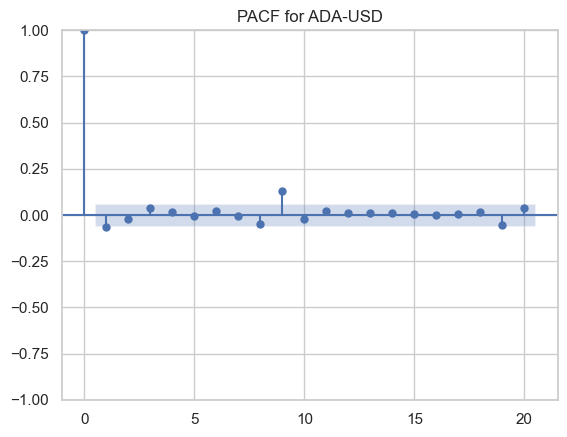

<Figure size 1200x600 with 0 Axes>

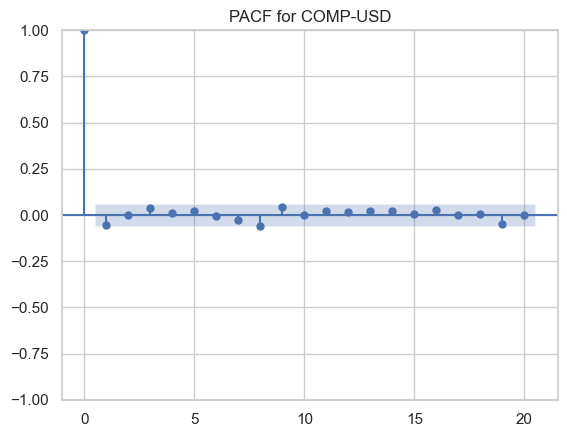

<Figure size 1200x600 with 0 Axes>

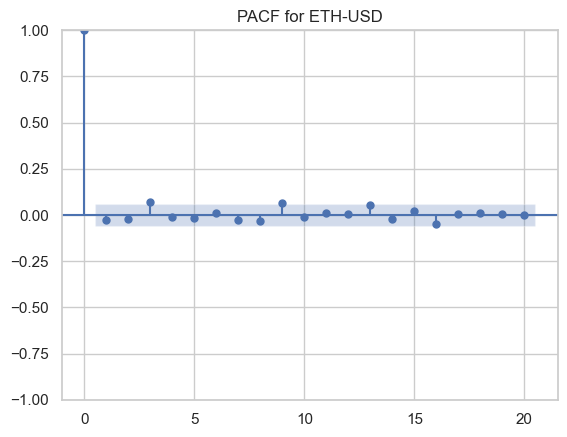

<Figure size 1200x600 with 0 Axes>

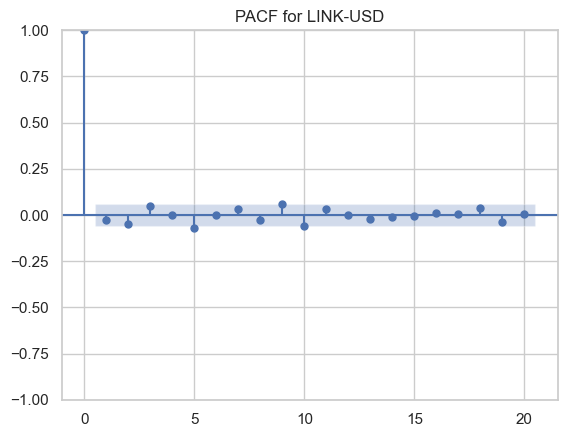

<Figure size 1200x600 with 0 Axes>

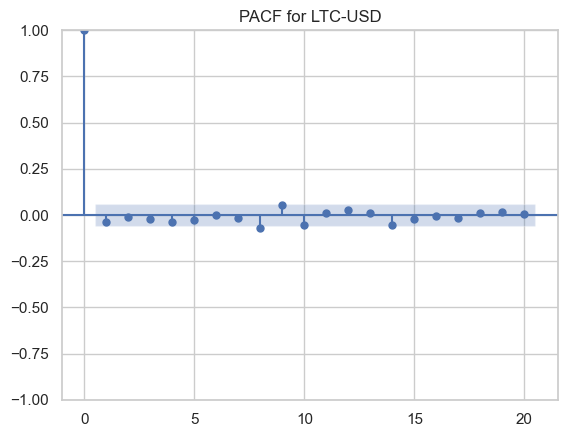

<Figure size 1200x600 with 0 Axes>

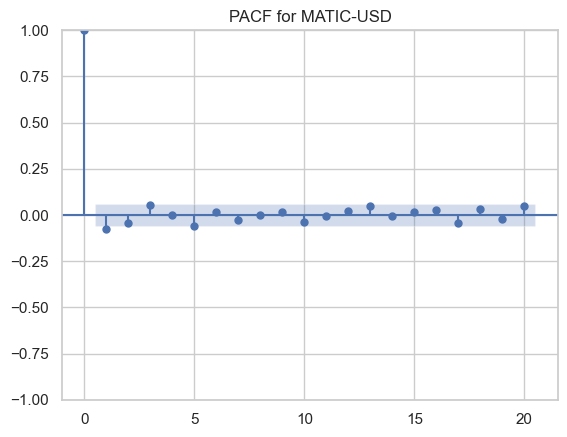

<Figure size 1200x600 with 0 Axes>

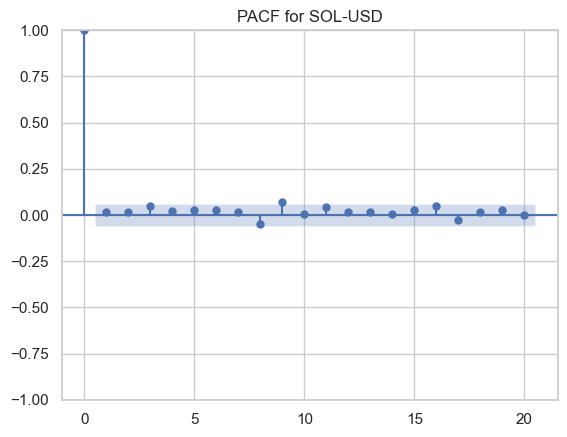

<Figure size 1200x600 with 0 Axes>

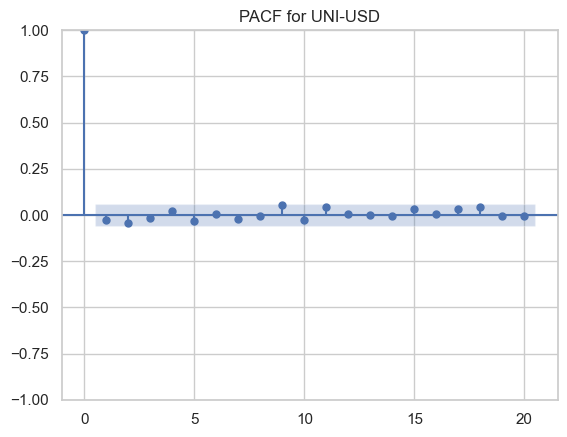

<Figure size 1200x600 with 0 Axes>

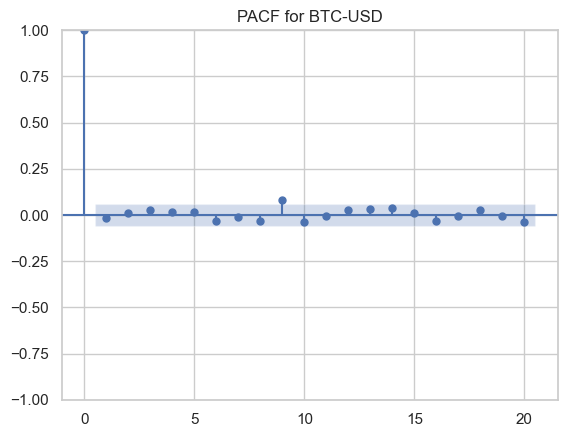

<Figure size 1200x600 with 0 Axes>

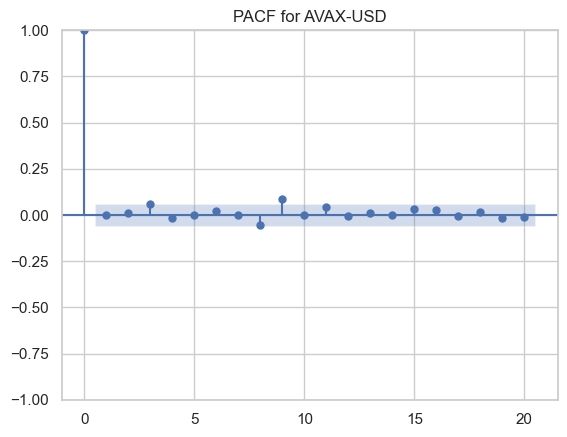

In [99]:
# Function to plot PACF
def plot_pacf_for_coin(coin_data, coin_name, lags=20):
    plt.figure(figsize=(12, 6))
    sm.graphics.tsa.plot_pacf(coin_data.dropna(), lags=lags, title=f'PACF for {coin_name}')
    plt.show()

# Iterate over each cryptocurrency
for coin in df_new_reset['product_id'].unique():
    # Assuming 'pct_change' is the column of interest
    coin_data = df_new_reset[df_new_reset['product_id'] == coin]['pct_change']
    plot_pacf_for_coin(coin_data, coin)

# Pacf (partial auto correlation) look it up!!
Suggestions:
EDA:
- determine whether the data is stationary or not!(Percentage change)!
- Interpret each visual!
- look into time series techniques!

## Final Checks Before Model Development

In [ ]:
# Display final structure of the dataset and check for any anomalies
print("Final Dataset Structure:")
print(df.info())
print("\nSummary Statistics:")
print(df.describe())

# Confirm train-test split
print("\nTraining Set Preview:")
print(train.head())
print("\nTest Set Preview:")
print(test.head())


## Model Development

In [ ]:
# # Prepare the feature matrix and target vector
# features = df.drop(['pct_change', 'product_id'], axis=1)  # Dropping non-numeric and target columns
# target = df['pct_change']

# # Splitting the data into training and testing sets
# X_train, X_test, y_train, y_test = train_test_split(features, target, test_size=0.2, random_state=42)

# # Initialize the Lasso Regression model with an alpha value
# lasso = Lasso(alpha=0.01, random_state=42)

# # Fit the model to the training data
# lasso.fit(X_train, y_train)

# # Predict on the training and test sets
# train_preds = lasso.predict(X_train)
# test_preds = lasso.predict(X_test)

# # Calculate and print performance metrics
# train_rmse = np.sqrt(mean_squared_error(y_train, train_preds))
# test_rmse = np.sqrt(mean_squared_error(y_test, test_preds))
# train_r2 = r2_score(y_train, train_preds)
# test_r2 = r2_score(y_test, test_preds)

# print(f"Training RMSE: {train_rmse}")
# print(f"Test RMSE: {test_rmse}")
# print(f"Training R^2: {train_r2}")
# print(f"Test R^2: {test_r2}")

In [101]:
# Put in all the metrics we would wanna display on our streamlit app!
# df.to_csv('Cleaned_Data/cleaned_crypto_data.csv')
tes_new = df_new_reset.sort_values(by='time', ascending=True)
tes_new.to_csv('Cleaned_Data/cleaned_crypto_updated_722.csv')

- Working on the peercentage change using the best variable and also looking up if its better to keep it as an decimal
- wroking on some of the plots to make them clearer and using specific time line(7-day)
- 

-try to modify the dashboard in a way tha we can click and change like hakkoda web!